## Assignment Instructions

### [<font color='#40E0D0'>1. Dataset Selection:</font>](#1_data_selection)
- Dataset link: https://www.kaggle.com/datasets/ahemateja19bec1025/traffic-sign-dataset-classification/data
- I choose traffic sign dataset which contain 58 classes, 4170 train images, 1994 test images
- But just 16 classes have number images > 100. So I choose only 10 classes with highest number of images (138-446 images/class). All these number can be configured by config variables
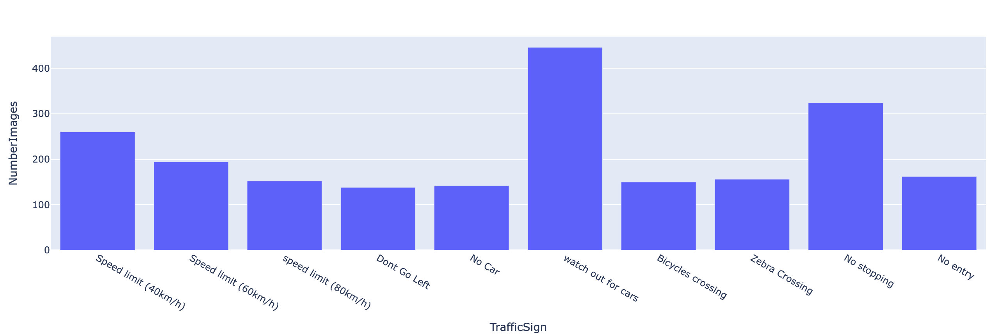
### [<font color='#40E0D0'>2. Data Preprocessing:</font>](#2_data_preprocessing)
- Perform data preprocessing steps: resizing (100x100), normalizing pixel values (Normalize with ImageNet stats), and splitting the dataset into training, validation, and test sets.
- Apply data augmentation techniques to increase the diversity of the training data: resize & crop images (100x100, crop 0.8-1.0), random rotation 15 deg, random brightness & contrast
- Total images loaded: 4460 train images and 920 test images
- Due to imbalanced dataset, I used `oversampling` technique to increase number of training set, then split training set to training and validation set. Final image count: Training 3568, Validation 892, Testing 920
- At first when I tried with different parameters and architecture, I also implemented function to ignore dark images or enhanced dark images before loading dataset (normalized images seem too dark). But I disabled all of them due to good results after many optimizations
   
### [<font color='#40E0D0'>3. Model Selection and Architecture:</font>](#3_model_selection_and_architecture)
- I start with a CNN which contained 4 blocks of Conv (Conv + ReLu + MaxPool2D + Dropout) and then Flatten -> Linear (1024 units, Relu activation) -> Linear output layer (10 class). Actually those parameters were partly optimized after testing. Other techniques (weight decay, BatchNorm) or architectures were tested in part 7,8
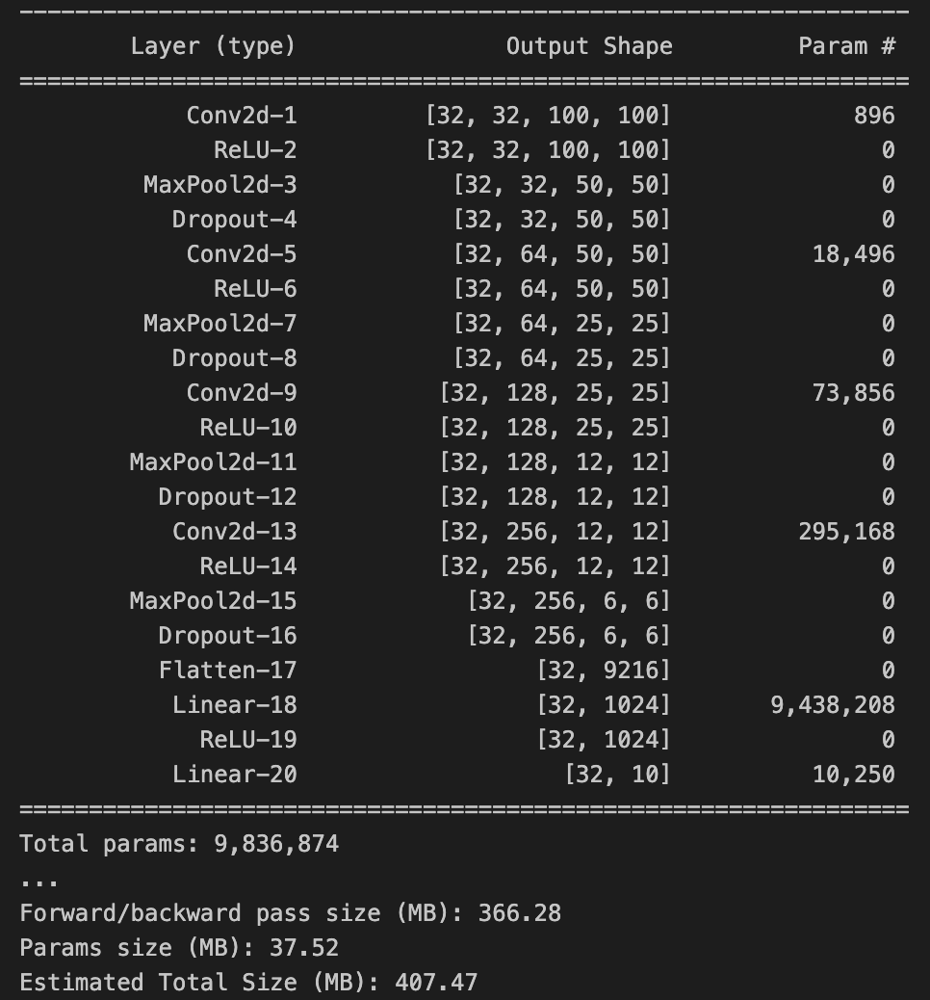

### [<font color='#40E0D0'>4. Model Training:</font>](#4_model_training)
- Train using the training and validation dataset. Using early stopping to prevent overfitting.

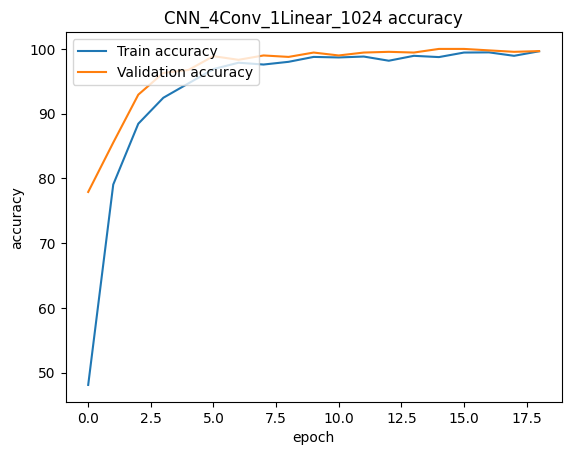
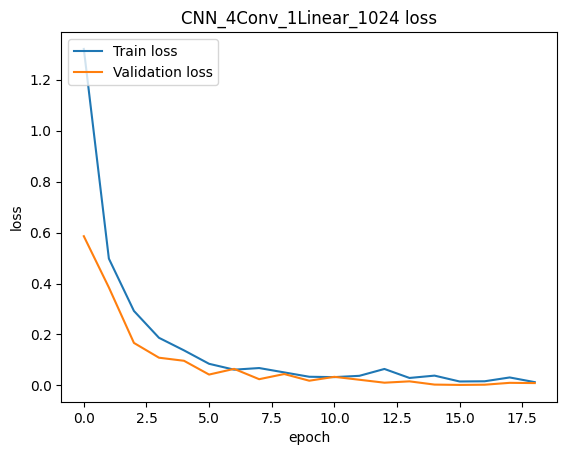

### [<font color='#40E0D0'>5. Hyperparameter Tuning:</font>](#5_hyperparameter_tuning)
### [<font color='#40E0D0'>6. Evaluation:</font>](#6_evaluation)
### [<font color='#40E0D0'>7. Fine-Tuning and Iteration:</font>](#7_fine_tuning_and_iteration)
- I combine above parts as I always tested with testset to compare all results later.
- I test with different hyper parameters (this is just some results of that)

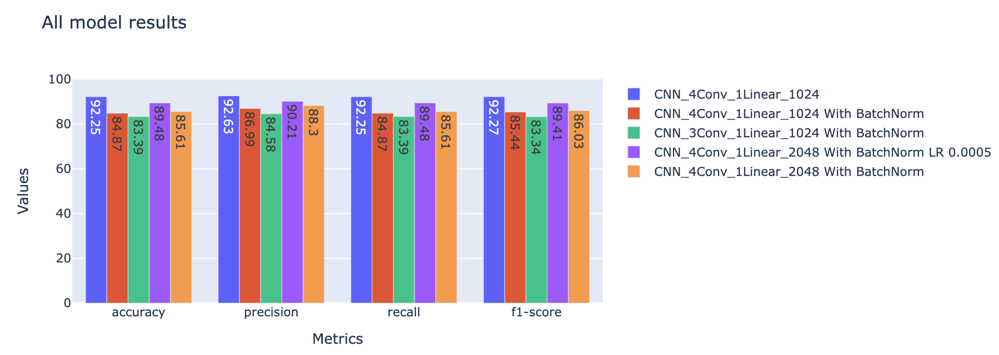

### [<font color='#40E0D0'>8. Final Model Testing:</font>](#8_final_model_testing)
- This is result of first model

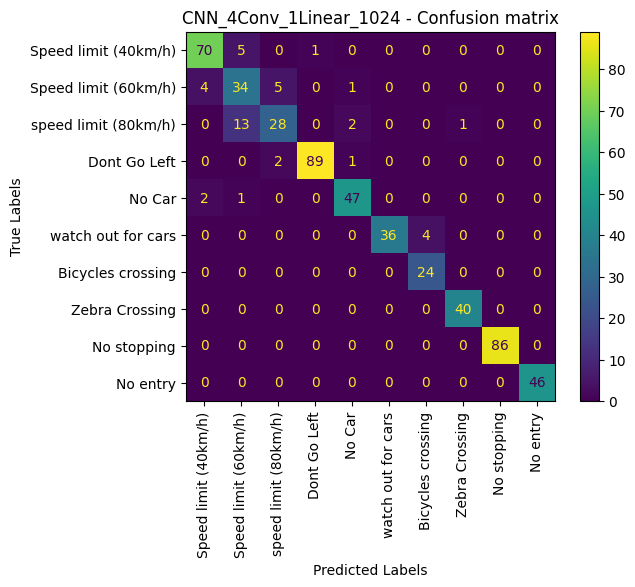
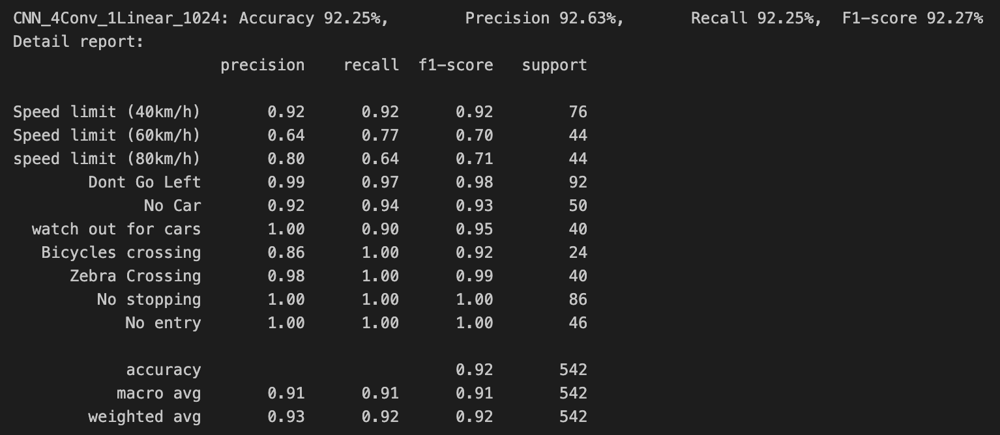
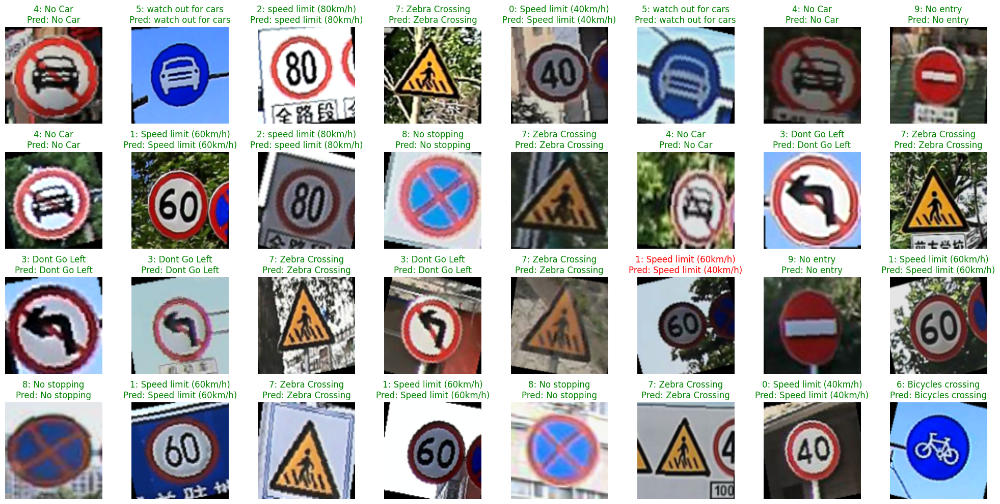

### [<font color='#40E0D0'>9. Documentation and Reporting:</font>](#9_documentation_and_reporting)
- Create a project report summarizing your dataset, model architecture, training process, evaluation results, and insights gained.
- Include visualizations and explanations to make your findings clear.

### 10. Presentation:
- Prepare a brief presentation to showcase your project's key findings and outcomes.
- Share your experiences, challenges faced, and lessons learned during the project.

### [<font color='#40E0D0'>11. Conclusion:</font>](#11_conclusion)
- Conclude your capstone project by summarizing your achievements and any future work or improvements that could be made to the model.


In [ ]:
import os, sys, random, time
import pandas as pd
import torch
from torch import nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from PIL import Image
from torchview import draw_graph
#from ignite.handlers import EarlyStopping
#from ignite.engine import Engine, Events
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import cv2
from pathlib import Path

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

RANDOM_SEED = 42

# Config to load image files
CONFIG_IGNORE_CLASS_WITH_LESS_THAN_NUM_IMAGES = 100 # With some classes has < 100 images, drop it
CONFIG_MAX_CLASS_TO_LOAD = 10 # Maximum classes to load, this dataset has >50 classes/traffic sign types, just use classes with highest number of sample images

# Config to preprocessing image files
CONFIG_ENHANCED_BRIGHTNESS_DARK_IMAGE = False # Preprocessing all dark images if needed (My models got acceptable results so I disable this)
CONFIG_IGNORE_DARK_IMAGE = False              # Ignore dark images (My models got acceptable results so I disable this)
CONFIG_DARK_IMAGE_BRIGHTNESS_THRESHOLD = 60  # Dark image threashold (not use if not ignore dark images)
CONFIG_DARK_IMAGE_GAMA_VALUE=1.5             # Higher is brighter (not use if not enhancing brightness)

# Config to handle imbalanced class
CONFIG_OVERSAMPLING = True

# Config save
CONFIG_SAVE_MODEL = True

# Config Default hyperparameters (tuned)
IMG_SIZE=100
BATCH_SIZE = 32
LEARNING_RATE = 0.0005
EPOCHS=30

# Check save dir
SAVE_DIR = "DeepLearningPytorch_INFO6147/Project/"
if not os.path.isdir(SAVE_DIR):
    SAVE_DIR=''

## 1. Data Selection <a id="1_data_selection"></a>

* Analyze number of image files and labels
* Choose classes or files to load
### Load labels file to view all classes/traffic sign labels

In [120]:
csv_file = SAVE_DIR+'data/labels.csv'  # Replace with the path to your CSV file
df = pd.read_csv(csv_file)
class_dict = df.set_index('ClassId')['Name'].to_dict()

# Show, sorted by numerical labels
class_dict

{0: 'Speed limit (5km/h)',
 1: 'Speed limit (15km/h)',
 2: 'Speed limit (30km/h)',
 3: 'Speed limit (40km/h)',
 4: 'Speed limit (50km/h)',
 5: 'Speed limit (60km/h)',
 6: 'Speed limit (70km/h)',
 7: 'speed limit (80km/h)',
 8: 'Dont Go straight or left',
 9: 'Dont Go straight or Right',
 10: 'Dont Go straight',
 11: 'Dont Go Left',
 12: 'Dont Go Left or Right',
 13: 'Dont Go Right',
 14: 'Dont overtake from Left',
 15: 'No Uturn',
 16: 'No Car',
 17: 'No horn',
 18: 'Speed limit (40km/h)',
 19: 'Speed limit (50km/h)',
 20: 'Go straight or right',
 21: 'Go straight',
 22: 'Go Left',
 23: 'Go Left or right',
 24: 'Go Right',
 25: 'keep Left',
 26: 'keep Right',
 27: 'Roundabout mandatory',
 28: 'watch out for cars',
 29: 'Horn',
 30: 'Bicycles crossing',
 31: 'Uturn',
 32: 'Road Divider',
 33: 'Traffic signals',
 34: 'Danger Ahead',
 35: 'Zebra Crossing',
 36: 'Bicycles crossing',
 37: 'Children crossing',
 38: 'Dangerous curve to the left',
 39: 'Dangerous curve to the right',
 40: 'Unk

### Count number of images per class

In [121]:
# Count number of images per class
img_dir = SAVE_DIR + 'data/traffic_Data/'

list_files = []
for numeric_label in os.listdir(img_dir+"DATA"):
    numeric_label_path = os.path.join(img_dir+"DATA", numeric_label)
    list_files.append({"Label": class_dict[int(numeric_label)],
                      "NumbericLabel": int(numeric_label),
                      "FileCount": len(os.listdir(numeric_label_path))})
    
# Convert result to dataframe, sort by number of image files per class
list_files_df = pd.DataFrame(list_files).sort_values(by=['FileCount'], ascending=False)

# Show all classes have number of image files > configurated threshold
if CONFIG_IGNORE_CLASS_WITH_LESS_THAN_NUM_IMAGES:
    list_files_df[list_files_df['FileCount'] > CONFIG_IGNORE_CLASS_WITH_LESS_THAN_NUM_IMAGES]

# Show
list_files_df # Sort by file count

,Label,NumbericLabel,FileCount
52,watch out for cars,28,446
30,No stopping,54,324
40,Speed limit (40km/h),3,260
41,Speed limit (60km/h),5,194
42,No entry,55,162
31,Zebra Crossing,35,156
18,speed limit (80km/h),7,152
14,Bicycles crossing,30,150
29,No Car,16,142
27,Dont Go Left,11,138


### Choose some appropriate classes only (drop all classes with low number of sample images)

In [122]:
# Load all classes have number of images > CONFIG_IGNORE_CLASS_WITH_LESS_THAN_NUM_IMAGES
if CONFIG_IGNORE_CLASS_WITH_LESS_THAN_NUM_IMAGES:
    load_categories=list(list_files_df[list_files_df['FileCount'] > CONFIG_IGNORE_CLASS_WITH_LESS_THAN_NUM_IMAGES]['NumbericLabel'])

# If limit by max number of classes, try to get classes with highest number of training sample images
if CONFIG_MAX_CLASS_TO_LOAD:
    load_categories=load_categories[:CONFIG_MAX_CLASS_TO_LOAD] 

# Sort again by original numberic labels (which group some class close togethers such as all Speed Limit sign)
load_categories.sort() 

load_categories # Can overide this list to manual load classes

[3, 5, 7, 11, 16, 28, 30, 35, 54, 55]

### Build dictionary to map numberical labels to traffic sign labels

In [123]:
# Built new class_dict reflect all classes in load_categories, but reassigning numberical labels from 0
class_dict_new = {i:class_dict[k] for i,k in enumerate(load_categories)}
class_dict_new

{0: 'Speed limit (40km/h)',
 1: 'Speed limit (60km/h)',
 2: 'speed limit (80km/h)',
 3: 'Dont Go Left',
 4: 'No Car',
 5: 'watch out for cars',
 6: 'Bicycles crossing',
 7: 'Zebra Crossing',
 8: 'No stopping',
 9: 'No entry'}

### Check again for imbalanced dataset, if CONFIG_OVERSAMPLING == True: use oversampling technique to handle (when load dataset)

In [124]:
image_count=[]
for k, label in class_dict_new.items():
    image_count.append({'Output': k,
                        'TrafficSign': label,
                        'OldNumbericLabel': load_categories[k],
                        'NumberImages': list_files_df[list_files_df['NumbericLabel'] == load_categories[k]]['FileCount'].to_numpy()[0]})
df = pd.DataFrame(image_count).set_index('Output')
df

,TrafficSign,OldNumbericLabel,NumberImages
Output,,,
0,Speed limit (40km/h),3,260
1,Speed limit (60km/h),5,194
2,speed limit (80km/h),7,152
3,Dont Go Left,11,138
4,No Car,16,142
5,watch out for cars,28,446
6,Bicycles crossing,30,150
7,Zebra Crossing,35,156
8,No stopping,54,324


In [125]:
fig = px.bar(df, x='TrafficSign', y = 'NumberImages')
fig.show()

### This data is imbalanced dataset

### 2. Data Preprocessing <a id="2_data_preprocessing"></a>
* Create DataLoader, transform, normalization (for resnet50)
* Preprocessing (if needed or configured)
* Use Data Augmentation (random adjust brightness, contrast, rotation, resize crop)


In [126]:
# Define transformations with ColorJitter
transform = transforms.Compose([
    transforms.ColorJitter(brightness=0.2, contrast=0.2),  # Random brightness & contrast
    transforms.RandomRotation(15),  # Rotate slightly
    transforms.RandomResizedCrop(size=IMG_SIZE, scale=(0.8, 1.0)),  # Random crop & resize
    transforms.ToTensor(),          # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

# Transform for test images
transform_test_data = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


### If CONFIG_ENHANCED_BRIGHTNESS_DARK_IMAGE, enhance brightness of some too dark images

In [127]:
def calculate_brightness(image):
    # Convert image to grayscale
    grayscale = image.convert("L")
    # Get the size of the image
    width, height = grayscale.size
    # Define the central zone (e.g., 20% of the width and height)
    x_start = int(width * 0.4)
    x_end = int(width * 0.6)
    y_start = int(height * 0.4)
    y_end = int(height * 0.6)
    # Crop the central zone
    central_zone = grayscale.crop((x_start, y_start, x_end, y_end))
    # Calculate the average brightness of the central zone
    brightness = np.mean(np.array(central_zone))
    return brightness

def avg_brightness(image, crop_fraction=0.5):
    """
    Calculate the average brightness of the center zone of an image.
    
    Args:
        image (numpy.ndarray): Input image (BGR).
        crop_fraction (float): Fraction of the image to crop from the center (0.0 to 1.0).
    
    Returns:
        float: Average brightness of the center zone.
    """
    height, width = image.shape[:2]
    crop_height = int(height * crop_fraction)
    crop_width = int(width * crop_fraction)
    
    # Calculate center coordinates
    center_y, center_x = height // 2, width // 2
    
    # Define the crop region
    start_y = max(center_y - crop_height // 2, 0)
    end_y = min(center_y + crop_height // 2, height)
    start_x = max(center_x - crop_width // 2, 0)
    end_x = min(center_x + crop_width // 2, width)
    
    # Crop the center region
    center_crop = image[start_y:end_y, start_x:end_x]
    
    # Convert to grayscale
    gray_crop = cv2.cvtColor(center_crop, cv2.COLOR_BGR2GRAY)
    
    # Calculate and return the average brightness
    avg_brightness = gray_crop.mean()
    return avg_brightness

def adjust_brightness_with_gamma(image, gamma=1.0):
    """Adjust brightness using gamma correction."""
    inv_gamma = 1.0 / gamma
    table = (np.arange(256) / 255.0) ** inv_gamma * 255
    table = np.uint8(table)
    return cv2.LUT(image, table)

def preprocess_dark_images(input_folder, output_folder, numeric_label, brightness_threshold=50):
    """Preprocess dark images in a folder and save to an output folder."""
    input_folder = Path(os.path.join(input_folder, str(numeric_label)))
    output_folder = Path(os.path.join(output_folder, str(numeric_label)))
    output_folder.mkdir(parents=True, exist_ok=True)
    
    for image_file in input_folder.iterdir():
        if image_file.suffix.lower() not in ['.jpg', '.png', '.jpeg']:
            continue
        
        # Read the image
        image = cv2.imread(str(image_file))
        
        # Check brightness and enhance if dark
        brightness = avg_brightness(image)
        if brightness < brightness_threshold:
            image = adjust_brightness_with_gamma(image, gamma=CONFIG_DARK_IMAGE_GAMA_VALUE)
            print (f"Enhanced brightness ({brightness}->{avg_brightness(image)}) of image {image_file}")
            # Change the processed image name
            output_path = output_folder / ("processed_" + image_file.name)
        else:
            output_path = output_folder / image_file.name
        cv2.imwrite(str(output_path), image)
    
    print(f"Preprocessed images saved to {output_folder}")

if CONFIG_ENHANCED_BRIGHTNESS_DARK_IMAGE:
    for numeric_label in load_categories:
        preprocess_dark_images(input_folder='DeepLearningPytorch_INFO6147/Project/data/traffic_Data/DATA/',
                            output_folder='DeepLearningPytorch_INFO6147/Project/data/traffic_Data/PROCESSED/',
                            numeric_label=numeric_label,
                            brightness_threshold=CONFIG_DARK_IMAGE_BRIGHTNESS_THRESHOLD)
                       

### Create `TrafficSignDataset` class to load data with some config

In [128]:
torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

class TrafficSignDataset(Dataset):
    def __init__(self, img_dir, csv_file, load_categories, brightness_threshold, is_train=True, transform=None, CONFIG_OVERSAMPLING=False, CONFIG_IGNORE_DARK_IMAGE=False):
        self.CONFIG_OVERSAMPLING = CONFIG_OVERSAMPLING
        self.CONFIG_IGNORE_DARK_IMAGE = CONFIG_IGNORE_DARK_IMAGE
        self.img_dir = img_dir
        self.transform = transform
        self.label_mapping = pd.read_csv(csv_file).set_index('ClassId')['Name'].to_dict()
        self.img_paths = []
        self.labels = []
        self.load_categories = load_categories
        # Load data based on train or test folder structure
        if is_train:
            for numeric_label in load_categories:
                numeric_label_path = os.path.join(img_dir, str(numeric_label))
                print(f"Loading [{self.label_mapping[int(numeric_label)]}] folder name {numeric_label} with {len(os.listdir(numeric_label_path))} files")
                try:
                    if os.path.isdir(numeric_label_path):
                        for img_name in os.listdir(numeric_label_path):
                            img_path = os.path.join(numeric_label_path, img_name)
                            # Calculate brightness and filter images 
                            image = Image.open(img_path).convert("RGB") 
                            brightness = calculate_brightness(image) 
                            if brightness >= brightness_threshold or self.CONFIG_IGNORE_DARK_IMAGE == False:
                                self.img_paths.append(img_path)
                                self.labels.append(numeric_label)
                            else:
                                print(f"Ignore dark image {img_path}: {brightness}")
                except:
                    print(f"Error load train folder {numeric_label}, ignore")
        else:
            for img_name in os.listdir(img_dir):
                try:
                    numeric_label=(img_name.split('_')[0])
                    if int(numeric_label) not in load_categories: continue # Ignore if not in list
                    #print (numeric_label)
                    print(f"Loading [{self.label_mapping[int(numeric_label)]}], file: {img_name}")
                    img_path = os.path.join(img_dir, img_name)
                    # Calculate brightness and filter images 
                    image = Image.open(img_path).convert("RGB") 
                    brightness = calculate_brightness(image) 
                    if brightness >= brightness_threshold:
                        self.img_paths.append(img_path)
                        self.labels.append(numeric_label)
                except:
                    print(f"Error load test file {img_name}, ignore")
        # Create an oversampled index list
        if self.CONFIG_OVERSAMPLING:
            self.oversampled_indices = self.create_oversampled_indices()
    
    def create_oversampled_indices(self):
        # Calculate the number of samples needed for each class to balance the dataset
        label_counts = Counter(self.labels)
        max_count = max(label_counts.values())

        oversampled_indices = []
        for label in label_counts:
            label_indices = [i for i, lbl in enumerate(self.labels) if lbl == label]
            oversampled_indices.extend(label_indices)
            oversampled_indices.extend(random.choices(label_indices, k=max_count - len(label_indices)))

        random.shuffle(oversampled_indices)
        return oversampled_indices
    
    def __len__(self):
        if self.CONFIG_OVERSAMPLING:
            return len(self.oversampled_indices)
        else:
            return len(self.img_paths)

    def __getitem__(self, idx):
        if self.CONFIG_OVERSAMPLING:
            idx = self.oversampled_indices[idx]
        img_path = self.img_paths[idx]
        image = Image.open(img_path).convert("RGB")
        numeric_label = self.load_categories.index(int(self.labels[idx])) # Get labels as index of load_categories, start from 0
        #text_label = self.label_mapping[numeric_label]
        if self.transform:
            image = self.transform(image)
        #return image, text_label
        return image, numeric_label
    
# Config data dir
img_dir =  SAVE_DIR + 'data/traffic_Data/'
csv_file = SAVE_DIR + 'data/labels.csv'
# Config dir for save processed dark image (if configured)
if CONFIG_ENHANCED_BRIGHTNESS_DARK_IMAGE:
    img_train_dir = img_dir+"PROCESSED"
else:
    img_train_dir = img_dir+"DATA"

# With test dataset, just load
img_test_dir = img_dir+"TEST"

# Create an instance of the custom dataset
train_set = TrafficSignDataset(img_dir=img_train_dir, 
                               csv_file=csv_file, 
                               transform=transform,
                               load_categories=load_categories,
                               brightness_threshold=CONFIG_DARK_IMAGE_BRIGHTNESS_THRESHOLD,
                               is_train=True,
                               CONFIG_OVERSAMPLING = CONFIG_OVERSAMPLING)
test_set = TrafficSignDataset(img_dir=img_test_dir, 
                               csv_file=csv_file, 
                               transform=transform_test_data, # No data augmentation here
                               load_categories=load_categories,
                               brightness_threshold=CONFIG_DARK_IMAGE_BRIGHTNESS_THRESHOLD,
                               is_train=False, 
                               CONFIG_OVERSAMPLING = False) # No over sampling test set

# Print number of images
print(f"Loaded {len(train_set)} train images")
print(f"Loaded {len(test_set)} test images")



Loading [Speed limit (40km/h)] folder name 3 with 260 files
Loading [Speed limit (60km/h)] folder name 5 with 194 files
Loading [speed limit (80km/h)] folder name 7 with 152 files
Loading [Dont Go Left] folder name 11 with 138 files
Loading [No Car] folder name 16 with 142 files
Loading [watch out for cars] folder name 28 with 446 files
Loading [Bicycles crossing] folder name 30 with 150 files
Loading [Zebra Crossing] folder name 35 with 156 files
Loading [No stopping] folder name 54 with 324 files
Loading [No entry] folder name 55 with 162 files
Loading [No stopping], file: 054_0021_j.png
Loading [Bicycles crossing], file: 030_1_0016_1_j.png
Loading [No stopping], file: 054_1_0001_1_j.png
Loading [Bicycles crossing], file: 030_0016_j.png
Loading [No stopping], file: 054_0069_j.png
Loading [Bicycles crossing], file: 030_0008_j.png
Loading [Zebra Crossing], file: 035_0005_j.png
Loading [No stopping], file: 054_1_0041_1_j.png
Loading [No stopping], file: 054_0048_j.png
Loading [Dont Go L

### Show sample images

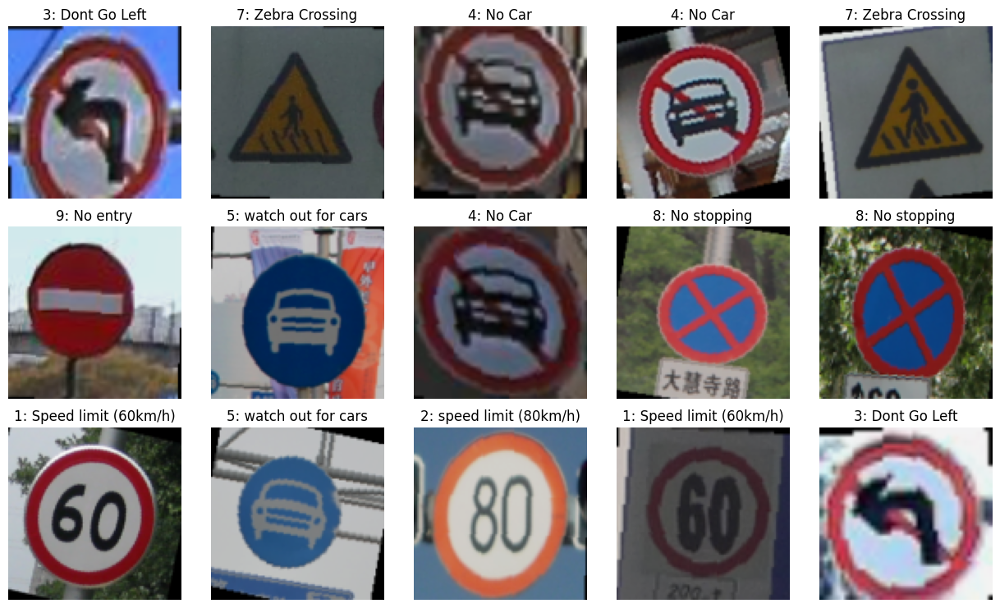

In [129]:
import matplotlib.pyplot as plt
import numpy as np

def display_images(dataset, rows, cols, y_true=None, y_pred=None, start=0, class_dict=class_dict_new, denormalize=True):
    """
    Display images from dataset with row x col grid

    """
    rows=min(int(len(dataset)/cols) + 1, rows)
    max_img=len(dataset)
    fig, axes = plt.subplots(rows, cols, figsize=(cols*2.5, rows*2.5))
    axes = axes.flatten()
    
    for i in range(rows * cols):
        if dataset != None and type(dataset) == TrafficSignDataset:
            if i >= max_img:
                axes[i].axis('off')
                continue
            image, label = dataset[i+start]
        elif y_true != None:
            if i >= max_img: 
                print (f'Max images {max_img} displayed')
                break
            image = dataset[i+start]
            label = y_true[i+start]
        # Denormalize if needed
        if denormalize:
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            image = image * std[:, np.newaxis, np.newaxis] + mean[:, np.newaxis, np.newaxis]
            image = np.clip(image, 0, 1)
        image = image.permute(1, 2, 0).numpy()
        
        axes[i].imshow(image)
        title = f"{label}"
        color = 'black'
        if (class_dict != None):
            title += f": {class_dict[label]}"
        if y_pred != None:
            pred_label = class_dict[y_pred[i+start]]
            title += f"\nPred: {pred_label}"
            color=("green" if label==y_pred[i] else "red")
        axes[i].set_title(title, color=color)
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

display_images(train_set, rows=3, cols=5, start=200)


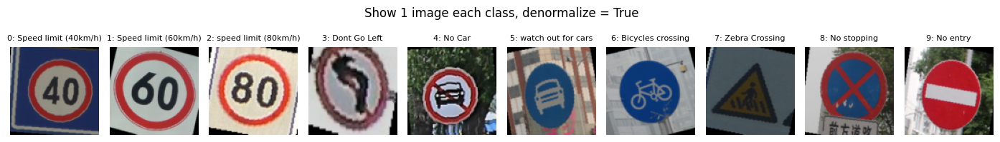

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.2456646].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..0.9667976].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.622571].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.8731157].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2739873].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.5639181].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.437

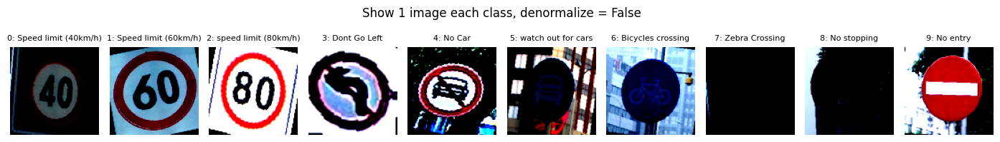

In [130]:
import numpy as np
import matplotlib.pyplot as plt

def show_one_image_per_class(dataset, label_map, denormalize=True):
    """
    Display one image per class.

    Parameters:
    - dataset: Dataset.
    - label_map: Dictionary mapping label indices to class names.
    """
    num_classes=len(label_map.keys())
    fig = plt.figure(figsize=(14, 2))
    
    shown_classes = 0
    # Loop through sorted label indices
    for image, label in dataset:
        if label == shown_classes:
            ax=fig.add_subplot(1,num_classes, shown_classes + 1)
            # Denormalize if needed
            if denormalize:
                mean = np.array([0.485, 0.456, 0.406])
                std = np.array([0.229, 0.224, 0.225])
                image = image * std[:, np.newaxis, np.newaxis] + mean[:, np.newaxis, np.newaxis]
                image = np.clip(image, 0, 1)
            ax.imshow(image.permute(1, 2, 0).numpy())
            ax.set_title(f'{label}: {label_map[label]}', fontsize=8)
            ax.axis('off')
            shown_classes += 1 # Next label id
            if shown_classes == num_classes:
                break
    plt.suptitle(f"Show 1 image each class, denormalize = {denormalize}")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

show_one_image_per_class(train_set, class_dict_new)
show_one_image_per_class(train_set, class_dict_new, denormalize=False)

### This dataset only split train and test. I split train to train (80%) + val (20%)

In [131]:
# Define the split sizes
train_size = int(0.8 * len(train_set))
val_size = len(train_set) - train_size

# Split the dataset
train_set, val_set = random_split(train_set, [train_size, val_size])
len(train_set), len(val_set), len(test_set)

(3568, 892, 542)

### Convert all to DataLoader

In [132]:
torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
# Create a DataLoader with the subset dataset
train_dataloader = DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=True)
test_dataloader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=True)

## 3. Model Selection and Architecture<a id="3_model_selection_and_architecture"></a>
* CNN model

In [133]:
class CNN_Model(nn.Module):
    def __init__(self, num_classes=10, 
                 conv_channels=[32, 64, 128, 256], 
                 use_batch_normalization=False,
                 conv_dropouts=[0.3, 0.3, 0.3, 0.3],
                 fc_units=1024
                 ):
        super(CNN_Model, self).__init__()
        
        self.conv_layers = nn.ModuleList()
        
        in_channels = 3  # Input image has 3 channels (RGB)
        
        for out_channels in conv_channels:
            layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)]
            if use_batch_normalization:
                layers.append(nn.BatchNorm2d(out_channels))
            layers.append(nn.ReLU())
            layers.append(nn.MaxPool2d(kernel_size=2, stride=2, padding=0))
            if conv_dropouts != None:
                layers.append(nn.Dropout(p=0.3))
            self.conv_layers.append(nn.Sequential(*layers))
            in_channels = out_channels

        # Calculate the size after the last conv block to define the input size for the fully connected layer
        self.fc_input_size = conv_channels[-1] * (100 // (2 ** len(conv_channels))) ** 2
        self.block_fc = nn.Sequential(
            nn.Flatten(start_dim=1, end_dim=-1),
            # Fully Connected Layers
            nn.Linear(self.fc_input_size, fc_units),
            nn.ReLU(),
            nn.Linear(fc_units, num_classes)
        )
        
    def forward(self, x):
        for conv_layer in self.conv_layers:
            x = conv_layer(x)
        x = self.block_fc(x)
        return x

# Example usage
model = CNN_Model(num_classes=len(class_dict_new.keys()),
                  conv_channels=[32, 64, 128, 256], 
                  use_batch_normalization=False,
                  conv_dropouts=[0.3, 0.3, 0.3, 0.3],
                  fc_units=1024).to(device)
model
#from torchsummary import summary

#summary(model, input_size = train_set[0][0].shape, batch_size = BATCH_SIZE)


CNN_Model(
  (conv_layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.3, inplace=False)
    )
    (1): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.3, inplace=False)
    )
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.3, inplace=False)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3)

In [134]:
from torchinfo import summary
summary(model, input_size = ([BATCH_SIZE] + list(train_set[0][0].shape)))

Layer (type:depth-idx)                   Output Shape              Param #
CNN_Model                                [32, 10]                  --
├─ModuleList: 1-1                        --                        --
│    └─Sequential: 2-1                   [32, 32, 50, 50]          --
│    │    └─Conv2d: 3-1                  [32, 32, 100, 100]        896
│    │    └─ReLU: 3-2                    [32, 32, 100, 100]        --
│    │    └─MaxPool2d: 3-3               [32, 32, 50, 50]          --
│    │    └─Dropout: 3-4                 [32, 32, 50, 50]          --
│    └─Sequential: 2-2                   [32, 64, 25, 25]          --
│    │    └─Conv2d: 3-5                  [32, 64, 50, 50]          18,496
│    │    └─ReLU: 3-6                    [32, 64, 50, 50]          --
│    │    └─MaxPool2d: 3-7               [32, 64, 25, 25]          --
│    │    └─Dropout: 3-8                 [32, 64, 25, 25]          --
│    └─Sequential: 2-3                   [32, 128, 12, 12]         --
│    │    

## 4. Model Training <a id="4_model_training"></a>

In [135]:
class EarlyStopping:
    """
    Custom EarlyStopping handler to stop training when a monitored metric has stopped decreasing.
    Also keep track best model parametes to load later.
    Always in min mode, with max mode, use -score value.
    Parameters:
    - patience (int): Number of epochs to wait for improvement before stopping training.
    - min_delta (float): Minimum change in the monitored metric to qualify as an improvement.
    """
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.delta = delta
        self.best_score = None
        self.early_stop = False
        self.counter = 0
        self.best_model_state = None
        self.best_epoch = 0

    def __call__(self, score, model, epoch):
        """ 
        Call method to update the early stopping logic with the latest score. 
        Parameters: 
        - score: The score value to monitor.
        - model: Model object to save best parameters.
        - epoch: Epoch number (for print only)
        """
        if self.best_score is None:
            self.best_score = score
            self.best_model_state = model.state_dict()
        elif score > self.best_score - self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                print(f"Early stopping with score {score}/{self.best_score} at epoch {epoch} after {self.patience} patiences")
                self.early_stop = True
        else:
            self.best_score = score
            self.best_model_state = model.state_dict()
            self.best_epoch = epoch
            self.counter = 0

    def load_best_model(self, model):
        """ 
        Restore best model parameters
        """
        print(f"Loading best model parameters at epoch {self.best_epoch}")
        model.load_state_dict(self.best_model_state)
    
    def should_stop(self):
        """ 
        Check if early stopping should be triggered based on the counter. 
        Returns: 
        - bool: True if training should be stopped, otherwise False. 
        """
        return self.early_stop

In [136]:
import torch.optim as optim


def training_step(model, train_dataloader, criterion, optimizer, device=device):
    """
    Training step for training model with all train dataloader (one epoch)
    Parameters:
    - model: Model object
    - train_dataloader: Training Dataloader
    - criterion: Loss function
    - optimizer: Optimizer for optimizing model parameters
    Returns:
    train_loss: Loss per batch
    train_accuracy: Accuracy of epoch (%)
    """
    model.train()
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0
    
    for images, labels in train_dataloader:
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Calculate accuracy
        predicted = outputs.argmax(dim=1)
        correct_predictions += (predicted == labels).sum().item()
        total_samples += labels.size(0)
    
    train_loss = running_loss / len(train_dataloader)
    train_accuracy = correct_predictions / total_samples * 100  # Accuracy in percentage
    return train_loss, train_accuracy

def evaluation_step(model, dataloader, criterion, device=device):
    """
    Evaluation step for evaluating model with dataset
    Parameters:
    - model: Model object
    - dataloader: Dataloader
    - criterion: Loss function
    Returns:
    loss: Loss per batch
    accuracy: Accuracy metric (%)
    """
    model.eval()
    loss = 0.0
    correct_predictions = 0
    total_samples = 0

    with torch.inference_mode():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)
            loss += criterion(outputs, labels).item()

            # Calculate accuracy
            predicted = outputs.argmax(dim=1)
            correct_predictions += (predicted == labels).sum().item()
            total_samples += labels.size(0)
    
    loss /= len(val_dataloader)
    accuracy = correct_predictions / total_samples * 100  # Accuracy in percentage
    return loss, accuracy

def training_loop(model, 
                  criterion, 
                  optimizer, 
                  early_stopping, 
                  epochs, 
                  device=device,
                  train_dataloader=train_dataloader,
                  val_dataloader=val_dataloader
                  ):
    start_time = time.time()
    # Track history each epoch
    history=[]

    # Move model to GPU if available
    model.to(device)

    # Training loop
    for epoch in range(epochs):
        # Training phase
        train_loss, train_accuracy = training_step(model, train_dataloader, criterion, optimizer, device=device)
        
        # Validation phase
        val_loss, val_accuracy = evaluation_step(model, val_dataloader, criterion, device=device)

        print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}% " + 
            f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")
        history.append({'epoch': epoch,
                        'train_loss': train_loss,
                        'train_accuracy': train_accuracy,
                        'val_loss': val_loss,
                        'val_accuracy': val_accuracy})
        
        # Check early stopping (always check min)
        early_stopping(val_loss, model, epoch+1) 
        if early_stopping.should_stop(): 
            early_stopping.load_best_model(model)
            break
    
    training_time = (time.time() - start_time)
    print(f"Training time: {training_time:.2f}s")
    return model, history, training_time

torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(params=model.parameters(), lr=LEARNING_RATE)

# Add EarlyStopping handler 
early_stopping = EarlyStopping(patience=3, delta=0)

model, history, training_time = training_loop(model, criterion, optimizer, early_stopping, epochs=EPOCHS)

Epoch [1/20], Train Loss: 1.1516, Train Accuracy: 55.16% Val Loss: 0.6080, Val Accuracy: 76.12%
Epoch [2/20], Train Loss: 0.4603, Train Accuracy: 80.47% Val Loss: 0.3634, Val Accuracy: 85.20%
Epoch [3/20], Train Loss: 0.2854, Train Accuracy: 88.48% Val Loss: 0.2315, Val Accuracy: 89.91%
Epoch [4/20], Train Loss: 0.1748, Train Accuracy: 93.19% Val Loss: 0.1648, Val Accuracy: 93.39%
Epoch [5/20], Train Loss: 0.1239, Train Accuracy: 94.90% Val Loss: 0.1167, Val Accuracy: 94.84%
Epoch [6/20], Train Loss: 0.0885, Train Accuracy: 96.19% Val Loss: 0.0739, Val Accuracy: 97.53%
Epoch [7/20], Train Loss: 0.0837, Train Accuracy: 96.69% Val Loss: 0.0474, Val Accuracy: 97.87%
Epoch [8/20], Train Loss: 0.0619, Train Accuracy: 97.53% Val Loss: 0.0641, Val Accuracy: 97.20%
Epoch [9/20], Train Loss: 0.0340, Train Accuracy: 98.74% Val Loss: 0.0241, Val Accuracy: 99.44%
Epoch [10/20], Train Loss: 0.0506, Train Accuracy: 98.32% Val Loss: 0.0250, Val Accuracy: 99.33%
Epoch [11/20], Train Loss: 0.0393, Trai

### Plot history

Plotting history with metric ['accuracy', 'loss']


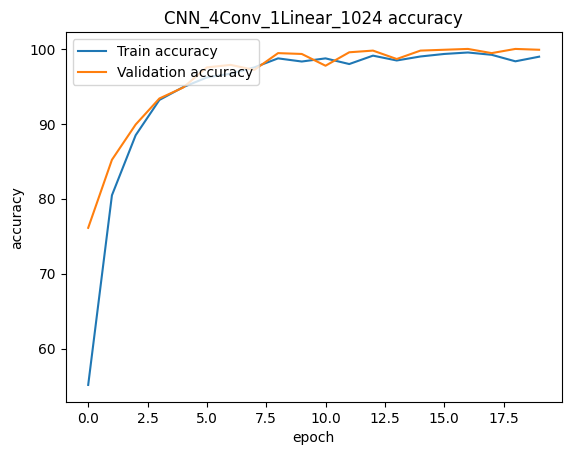

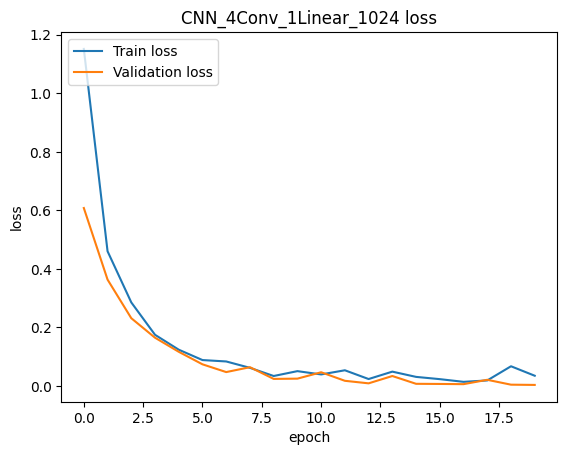

In [137]:

def plot_history(history, val=False, metrics=['accuracy', 'loss'], model_name = None):
    """
    plot_history : Plot training history
    Parameters
    ----------
    history : keras history object
    val : Default False, for plot validation metric
    metrics: Default ['accuracy', 'loss'], list of metric to plot
    """
    print(f'Plotting history with metric {metrics}')
    for metric in metrics:
        # summarize history for metric
        plt.plot(history['train_'+metric])
        if (val): plt.plot(history['val_'+metric])
        if model_name:
            plt.title(model_name + " " + metric)
        else:
            plt.title('Model ' + metric)
        plt.ylabel(metric)
        plt.xlabel('epoch')
        if (val): 
            plt.legend(['Train '+metric, 'Validation ' + metric], loc='upper left')
        else:
            plt.legend(['Train ' + metric], loc='upper left')
        plt.show()

history = pd.DataFrame(history)
plot_history(history, 
             val=True,
             metrics=['accuracy', 'loss'],
             model_name="CNN_4Conv_1Linear_1024")

## 6. Evaluation<a id="6_evaluation"></a>
* Evaluation with test set

CNN_4Conv_1Linear_1024: Accuracy 90.77%,	Precision 92.42%,	Recall 90.77%,	F1-score 90.49%
Detail report: 
                      precision    recall  f1-score   support

Speed limit (40km/h)       1.00      0.95      0.97        76
Speed limit (60km/h)       0.60      0.95      0.74        44
speed limit (80km/h)       0.90      0.41      0.56        44
        Dont Go Left       0.98      0.96      0.97        92
              No Car       0.92      0.92      0.92        50
  watch out for cars       0.89      0.85      0.87        40
   Bicycles crossing       0.71      0.83      0.77        24
      Zebra Crossing       1.00      1.00      1.00        40
         No stopping       0.98      1.00      0.99        86
            No entry       1.00      1.00      1.00        46

            accuracy                           0.91       542
           macro avg       0.90      0.89      0.88       542
        weighted avg       0.92      0.91      0.90       542



<Figure size 1000x1000 with 0 Axes>

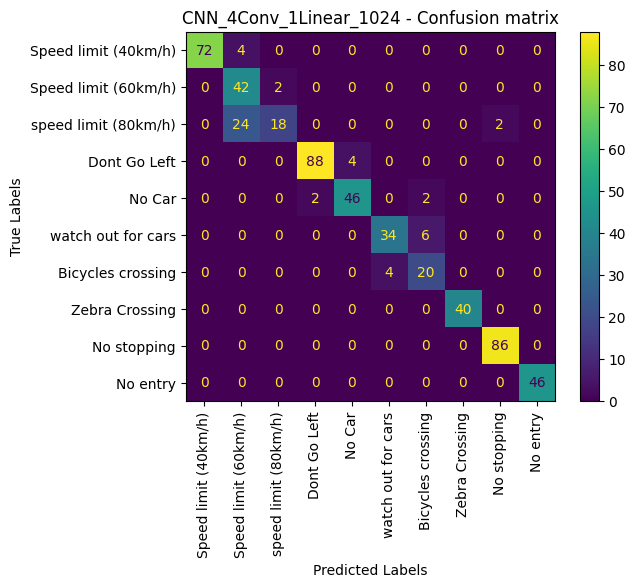

In [138]:
from sklearn.metrics import classification_report, confusion_matrix, multilabel_confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, ConfusionMatrixDisplay

def evaluation(model, dataloader, device=device):
    """
    Evaluation return prediction result of model with dataloader
    Parameters:
    - model: Model object
    - dataloader: Dataloader
    Returns:
    y_true: True labels
    y_pred: Prediction labels
    accuracy: Accuracy metric (%)
    """
    model.eval()
    y_pred = []
    y_true = []
    correct_predictions = 0
    total_samples = 0

    with torch.inference_mode():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)

            # Calculate accuracy
            predicted = outputs.argmax(dim=1)
            correct_predictions += (predicted == labels).sum().item()
            total_samples += labels.size(0)

            y_true.extend(labels.cpu())
            y_pred.extend(predicted.cpu())
    
    return y_true, y_pred, (correct_predictions / total_samples * 100)

def model_report(model_name, 
                 y_test, 
                 y_pred, 
                 class_names=None,
                 plot = True, 
                 print_report = True,
                 n_digits_round=2):
    """
    Report classification model metric (accuracy, precision, recall, f1-score), save to python dict report_data, write to a CSV file
    Parameters
    ----------
    model_name : Name of model
    model : Model object (unused in this project)
    y_test : Test set output
    y_pred : Prediction result
    class_names : List of output class/label name
    model_type : Model type (to write to csv file)
    model_note : Model note (to write to csv file)
    plot : Plot Confusion Matrix, default True
    print_report : Print classification report (sklearn library), default True
    n_digits_round : Number of digits after decimal point, default 2
    """
    accuracy  = round(accuracy_score(y_test, y_pred)*100, ndigits=n_digits_round)
    precision = round(precision_score(y_test, y_pred, average='weighted')*100, ndigits=n_digits_round)
    recall     = round(recall_score(y_test, y_pred, average='weighted')*100, ndigits=n_digits_round)
    f1  = round(f1_score(y_test, y_pred, average='weighted')*100, ndigits=n_digits_round)
    print(f"{model_name}: Accuracy {accuracy}%,\tPrecision {precision}%,\tRecall {recall}%,\tF1-score {f1}%")
    
    # Print detail report
    if print_report:
        print ("Detail report: ")
        print (classification_report(y_test, y_pred, target_names=class_names))
    
    cm = confusion_matrix(y_test, y_pred)
    # Display confusion matrix plot
    if (plot):
        plt.figure(figsize=(10, 10))
        #disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test_label, y_pred_label), display_labels=class_names)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
        disp.plot()
        plt.xticks(rotation='vertical')
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.title(model_name + " - Confusion matrix")
        plt.show()
    
    return {'accuracy': accuracy,
            'precision': precision, 
            'recall': recall, 
            'f1-score': f1,
            'cm': cm}

y_true, y_pred, acc = evaluation(model=model,
                                 dataloader=test_dataloader,
                                )

#print(f"Test set result: Accuracy: {acc:.2f}%")
results = model_report(model_name="CNN_4Conv_1Linear_1024",
                       y_test=y_true,
                       y_pred=y_pred,
                       class_names=class_dict_new.values(),
                       plot=True,
                       print_report=True)


### Show test images with prediction

Test batch num 1


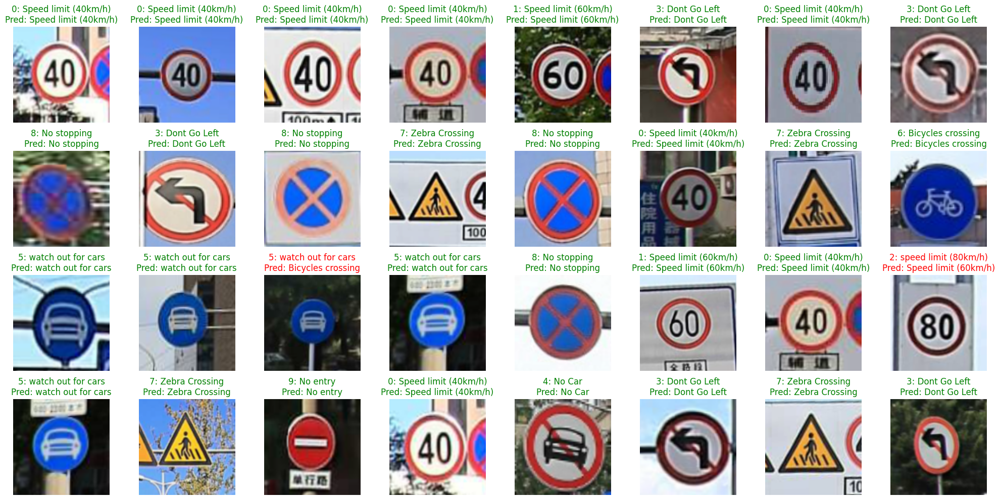

Test batch num 2


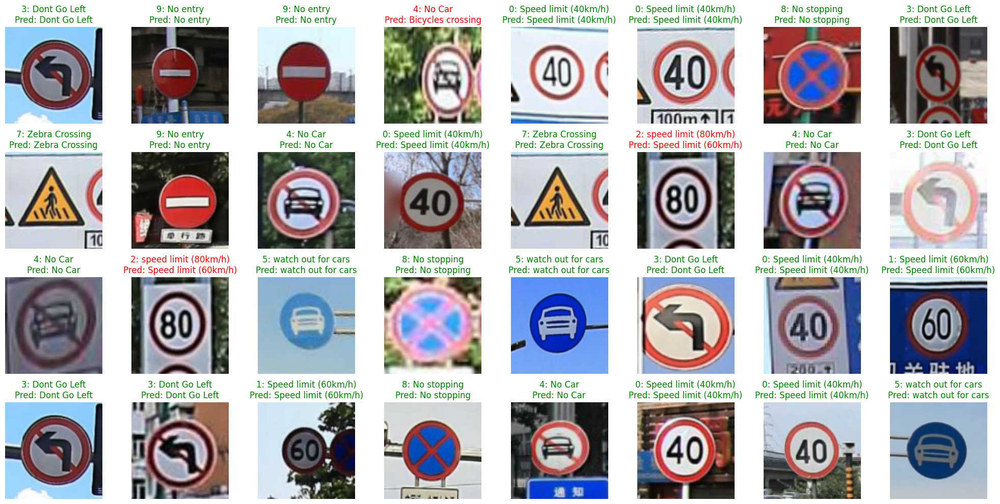

Test batch num 3


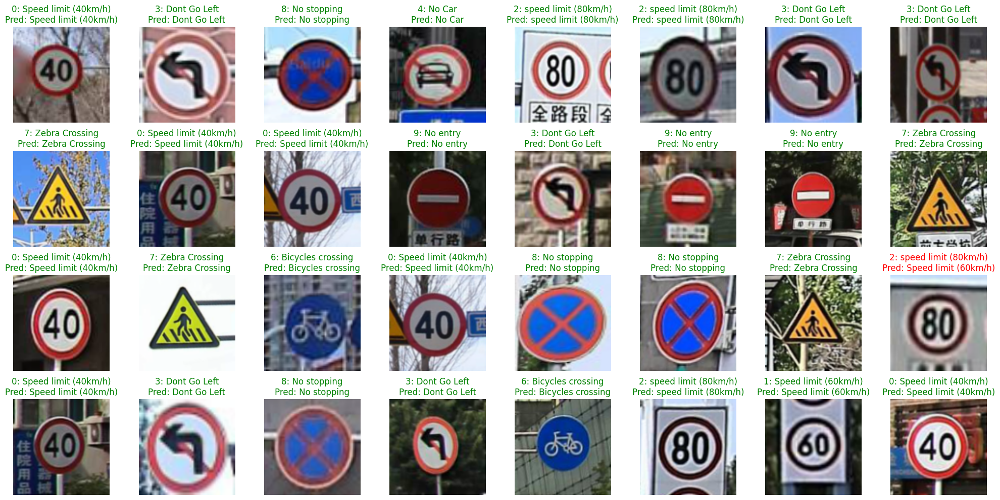

In [139]:
def show_prediction_images(model, test_dataloader, num_batch = 3, device=device):
    torch.manual_seed(RANDOM_SEED)
    np.random.seed(RANDOM_SEED)

    with torch.inference_mode():
        batch = 0
        for imgs, labels in test_dataloader:
            batch += 1
            print (f"Test batch num {batch}")
            imgs = imgs.to(device)
            labels = labels.to(device)
            outputs = model(imgs)
            _, y_pred = torch.max(outputs, 1)
            y_pred = [i.item() for i in y_pred]
            y_true = [i.item() for i in labels]
            display_images(imgs.cpu(), 4, 8, y_true=y_true, start=0, y_pred=y_pred)
            if (batch >= num_batch): break

# Show prediction results from testset
show_prediction_images(model=model,
                      test_dataloader=test_dataloader,
                      num_batch=3)

### Save/Load Model

In [140]:
import os, pickle

def save_data(data, name, directory):
    """
    Save python object to file
    """
    if not os.path.exists(directory) and directory != '':
        os.makedirs(directory)
    filepath = os.path.join(directory, f'{name}.pkl')
    with open(filepath, 'wb') as file:
        pickle.dump(data, file)

def load_data(name, directory):
    """
    Load python object from file
    """
    filepath = os.path.join(directory, f'{name}.pkl')
    print (f"Loading {filepath}")
    with open(filepath, 'rb') as file:
        data = pickle.load(file)
        return data
    return None

if CONFIG_SAVE_MODEL:
    torch.save(model.state_dict(), SAVE_DIR+"Pytorch_CNN_4Conv_1Linear_1024.pkl")

### Clear memory before training other models

In [141]:
import gc
# After training, move model to cpu to free mem
model.to('cpu')

# Empty the cache 
torch.cuda.empty_cache() 

# Run garbage collection
gc.collect()

134936

In [142]:
print(torch.cuda.memory_summary(device='cuda', abbreviated=False).replace('\\n', '\n'))

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      | 208772 KiB |   1126 MiB |  17891 GiB |  17890 GiB |
|       from large pool | 206720 KiB |   1124 MiB |  17791 GiB |  17791 GiB |
|       from small pool |   2052 KiB |      5 MiB |     99 GiB |     99 GiB |
|---------------------------------------------------------------------------|
| Active memory         | 208772 KiB |   1126 MiB |  17891 GiB |  17890 GiB |
|       from large pool | 206720 KiB |   1124 MiB |  17791 GiB |

In [143]:
!nvidia-smi

Tue Dec  3 19:41:43 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.120                Driver Version: 550.120        CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3060        Off |   00000000:01:00.0 Off |                  N/A |
| 55%   48C    P2             35W /  170W |    2550MiB /  12288MiB |     11%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [144]:
import psutil
from IPython.display import display, clear_output
import time
import psutil
import gc

def display_memory_usage():
    # Get memory usage information
    memory_info = psutil.virtual_memory()
    used_memory = memory_info.used / (1024 ** 3)  # Convert bytes to GB
    total_memory = memory_info.total / (1024 ** 3)  # Convert bytes to GB

    # Display memory usage
    clear_output(wait=True)
    display(f"Memory Usage: {used_memory:.2f} GB / {total_memory:.2f} GB")

def get_variable_sizes():
    # Get a list of all variables in the global namespace
    variables = list(globals().keys())
    sizes = []

    for var in variables:
        # Check if the variable is a large object
        if isinstance(globals()[var], (list, dict, set, bytearray, memoryview)):
            sizes.append((var, psutil.Process().memory_info().rss // (1024 ** 2)))  # Convert bytes to MB

    # Sort the variables by size
    sizes.sort(key=lambda x: x[1], reverse=True)
    return sizes

# Display the memory usage
display_memory_usage()

# Display the sorted variable sizes
for var, size in get_variable_sizes():
    print(f"{var}: {size} MB")

'Memory Usage: 6.71 GB / 61.77 GB'

_ih: 2346 MB
_oh: 2346 MB
_dh: 2346 MB
In: 2346 MB
Out: 2346 MB
class_dict_new: 2346 MB
model_list: 2346 MB
_14: 2346 MB
load_categories: 2346 MB
_16: 2346 MB
_17: 2346 MB
results: 2346 MB
_42: 2346 MB
_57: 2346 MB
_59: 2346 MB
_60: 2346 MB
_84: 2346 MB
img_false_list: 2346 MB
y_true_list: 2346 MB
y_pred_list: 2346 MB
labels_list: 2346 MB
class_dict: 2346 MB
_120: 2346 MB
list_files: 2346 MB
_122: 2346 MB
_123: 2346 MB
image_count: 2346 MB
y_true: 2346 MB
y_pred: 2346 MB


In [145]:
try: 
    del class_dict
    del image_count
    del y_true
    del y_pred
    del list_files
except:
    pass

In [146]:
display_memory_usage()

'Memory Usage: 6.71 GB / 61.77 GB'

## 5. Hyperparameter Tuning <a id="5_hyperparameter_tuning"></a>

## 7. Fine-Tuning and Iteration <a id="7_fine_tuning_and_iteration"></a>

## 8. Final Model Testing <a id="8_final_model_testing"></a>

### I created a function to test hyper parameters, test different model architecture, fine tuning
### Above model was tuned its parameters to get a acceptable result. 
### Below code just for testing and experiencing different techniques as well as architectures, test models do not always get better result.

In [147]:
class ModelData():
    """ 
    Class Object to save all model information and results
    """
    def __init__(self, model, model_name, history, training_time, notes, model_type='Pytorch', results=None) -> None:
        self.model = model
        self.model_name = model_name
        self.history = history
        self.training_time = training_time
        self.notes = notes
        self.model_type = model_type
        if results:
            self.results = results
        else:
            self.results = {'accuracy': 0,
                            'precision': 0, 
                            'recall': 0, 
                            'f1-score': 0,
                            'cm':0}

    def to_dict(self):
        return {
            'model_name': self.model_name,
            'model_type': self.model_type,
            'training_time': self.training_time,
            'accuracy': self.results['accuracy'],
            'precision': self.results['precision'], 
            'recall': self.results['recall'], 
            'f1-score': self.results['f1-score'],
            'cm':self.results['cm'],
            'notes': self.notes,
        }

# Create a list to store all model data and parameters
# Save original model (fine tuned a bit)
model_list = [
    ModelData(model=model.to('cpu'),# Save mem
              model_name="CNN_4Conv_1Linear_1024",
              model_type="Pytorch CNN",
              history=history,
              training_time=training_time,
              notes=f'LR{LEARNING_RATE}, BS{BATCH_SIZE}, EP{len(history)}/{EPOCHS}, Device {device}',
              results=results)
    ]
model_list[0].to_dict() 

{'model_name': 'CNN_4Conv_1Linear_1024',
 'model_type': 'Pytorch CNN',
 'training_time': 119.86579656600952,
 'accuracy': 90.77,
 'precision': 92.42,
 'recall': 90.77,
 'f1-score': 90.49,
 'cm': array([[72,  4,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0, 42,  2,  0,  0,  0,  0,  0,  0,  0],
        [ 0, 24, 18,  0,  0,  0,  0,  0,  2,  0],
        [ 0,  0,  0, 88,  4,  0,  0,  0,  0,  0],
        [ 0,  0,  0,  2, 46,  0,  2,  0,  0,  0],
        [ 0,  0,  0,  0,  0, 34,  6,  0,  0,  0],
        [ 0,  0,  0,  0,  0,  4, 20,  0,  0,  0],
        [ 0,  0,  0,  0,  0,  0,  0, 40,  0,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0, 86,  0],
        [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 46]]),
 'notes': 'LR0.001, BS32, EP20/20, Device cuda'}

In [148]:
def try_model(model_name, 
              notes,
              conv_channels=[32, 64, 128, 256], 
              use_batch_normalization=True,
              conv_dropouts=[0.3, 0.3, 0.3, 0.3],
              fc_units=1024,
              lr=LEARNING_RATE,
              weight_decay=0,
              epochs=EPOCHS,
              batch_size=BATCH_SIZE,
              train_dataloader=train_dataloader,
              test_dataloader=test_dataloader,
              val_dataloader=val_dataloader,
              device=device
              ):
    torch.manual_seed(RANDOM_SEED)
    np.random.seed(RANDOM_SEED)
    # Try another model
    model = CNN_Model(num_classes=len(class_dict_new.keys()),
                     conv_channels=conv_channels, 
                     use_batch_normalization=use_batch_normalization,
                     conv_dropouts=conv_dropouts,
                     fc_units=fc_units).to(device)
    summary(model, input_size = ([batch_size] + list(train_set[0][0].shape)))
    
    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    if (weight_decay > 0):
        optimizer = optim.Adam(params=model.parameters(),
                            lr=lr, weight_decay=weight_decay)
    else:
        optimizer = optim.Adam(params=model.parameters(),
                            lr=lr)

    torch.manual_seed(RANDOM_SEED)
    np.random.seed(RANDOM_SEED)
    
    # Add EarlyStopping handler 
    early_stopping = EarlyStopping(patience=3, delta=0)

    # Training
    model, history, training_time = training_loop(model, 
                                                  criterion, 
                                                  optimizer, 
                                                  early_stopping, 
                                                  epochs=epochs,
                                                  train_dataloader=train_dataloader,
                                                  val_dataloader=val_dataloader,
                                                  device=device)
    
    # Plot history
    history = pd.DataFrame(history)
    plot_history(history, 
                val=True,
                metrics=['accuracy', 'loss'],
                model_name=model_name)

    # Evaluation
    y_true, y_pred, acc = evaluation(model=model,
                                     dataloader=test_dataloader,
                                     device=device)

    #print(f"Test set result: Accuracy: {acc:.2f}%")
    results = model_report(model_name=model_name,
                           y_test=y_true,
                           y_pred=y_pred,
                           class_names=class_dict_new.values(),
                           plot=True,
                           print_report=True)

    # Add to model list
    model_list.append(ModelData(model=model.to('cpu'), # Save mem
                                model_name=model_name,
                                model_type="Pytorch CNN",
                                history=history,
                                training_time=training_time,
                                notes=f'{notes} LR{lr}, BS{batch_size}, EP{len(history)}/{epochs}, Device {device}',
                                results=results))
    #print(torch.cuda.memory_summary(device='cuda', abbreviated=False).replace('\\n', '\n'))

In [149]:
len(model_list[0].history)

20

Epoch [1/20], Train Loss: 2.4855, Train Accuracy: 39.97% Val Loss: 1.2114, Val Accuracy: 54.71%
Epoch [2/20], Train Loss: 0.6071, Train Accuracy: 75.42% Val Loss: 0.7919, Val Accuracy: 68.61%
Epoch [3/20], Train Loss: 0.3448, Train Accuracy: 86.13% Val Loss: 0.3503, Val Accuracy: 85.87%
Epoch [4/20], Train Loss: 0.2170, Train Accuracy: 91.42% Val Loss: 0.1482, Val Accuracy: 93.72%
Epoch [5/20], Train Loss: 0.1736, Train Accuracy: 93.02% Val Loss: 0.1571, Val Accuracy: 94.73%
Epoch [6/20], Train Loss: 0.1236, Train Accuracy: 95.18% Val Loss: 0.0972, Val Accuracy: 96.30%
Epoch [7/20], Train Loss: 0.0815, Train Accuracy: 97.14% Val Loss: 0.0400, Val Accuracy: 98.21%
Epoch [8/20], Train Loss: 0.0678, Train Accuracy: 97.34% Val Loss: 0.0725, Val Accuracy: 97.31%
Epoch [9/20], Train Loss: 0.0437, Train Accuracy: 98.18% Val Loss: 0.0427, Val Accuracy: 98.54%
Epoch [10/20], Train Loss: 0.0453, Train Accuracy: 98.35% Val Loss: 0.0262, Val Accuracy: 99.22%
Epoch [11/20], Train Loss: 0.0258, Trai

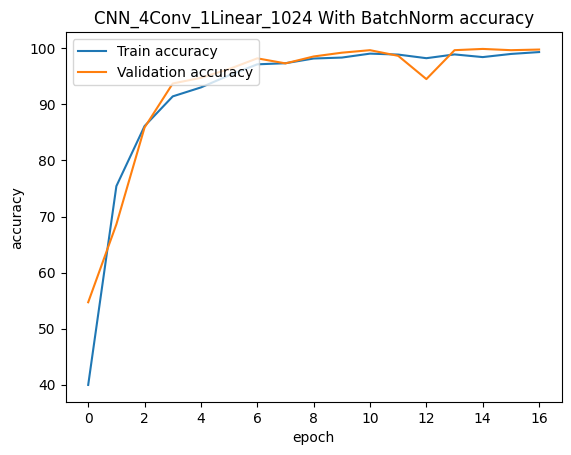

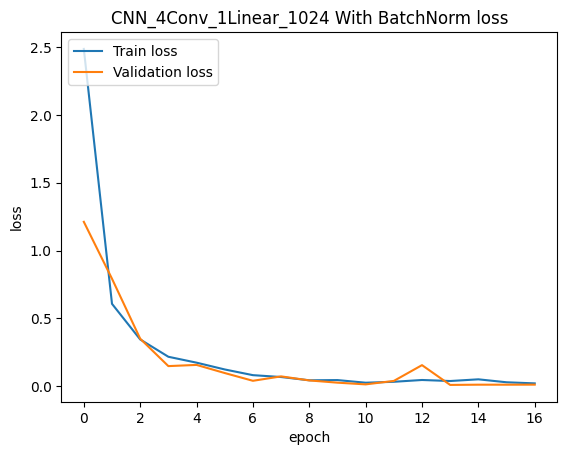

CNN_4Conv_1Linear_1024 With BatchNorm: Accuracy 87.45%,	Precision 91.55%,	Recall 87.45%,	F1-score 86.32%
Detail report: 
                      precision    recall  f1-score   support

Speed limit (40km/h)       0.93      1.00      0.96        76
Speed limit (60km/h)       0.55      0.95      0.70        44
speed limit (80km/h)       1.00      0.23      0.37        44
        Dont Go Left       0.98      0.96      0.97        92
              No Car       0.82      0.92      0.87        50
  watch out for cars       1.00      0.55      0.71        40
   Bicycles crossing       0.60      1.00      0.75        24
      Zebra Crossing       1.00      1.00      1.00        40
         No stopping       1.00      0.98      0.99        86
            No entry       1.00      0.91      0.95        46

            accuracy                           0.87       542
           macro avg       0.89      0.85      0.83       542
        weighted avg       0.92      0.87      0.86       542



<Figure size 1000x1000 with 0 Axes>

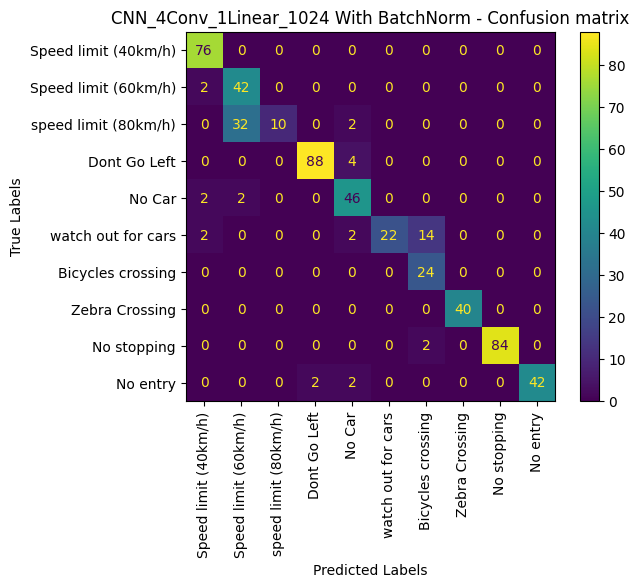

In [150]:
try_model(model_name='CNN_4Conv_1Linear_1024 With BatchNorm', 
          notes='BatchNorm, weigh decay',
          conv_channels=[32, 64, 128, 256], 
          use_batch_normalization=True, # Use batch Norm
          conv_dropouts=[0.3, 0.3, 0.3, 0.3],
          fc_units=1024,
          lr=LEARNING_RATE,
          weight_decay=0.0001, # Use Weigh decay
          epochs=EPOCHS,
          batch_size=BATCH_SIZE,) #Not change, tested, not re processing dataloader

Epoch [1/20], Train Loss: 4.6589, Train Accuracy: 60.45% Val Loss: 0.5302, Val Accuracy: 80.16%
Epoch [2/20], Train Loss: 0.3952, Train Accuracy: 84.53% Val Loss: 0.3533, Val Accuracy: 86.55%
Epoch [3/20], Train Loss: 0.2911, Train Accuracy: 88.51% Val Loss: 0.2853, Val Accuracy: 87.44%
Epoch [4/20], Train Loss: 0.2184, Train Accuracy: 91.87% Val Loss: 0.2431, Val Accuracy: 89.46%
Epoch [5/20], Train Loss: 0.1890, Train Accuracy: 92.88% Val Loss: 0.2577, Val Accuracy: 88.90%
Epoch [6/20], Train Loss: 0.1795, Train Accuracy: 92.68% Val Loss: 0.2243, Val Accuracy: 91.70%
Epoch [7/20], Train Loss: 0.1242, Train Accuracy: 95.18% Val Loss: 0.1037, Val Accuracy: 94.62%
Epoch [8/20], Train Loss: 0.1121, Train Accuracy: 95.63% Val Loss: 0.0754, Val Accuracy: 97.09%
Epoch [9/20], Train Loss: 0.1018, Train Accuracy: 96.27% Val Loss: 0.1671, Val Accuracy: 93.83%
Epoch [10/20], Train Loss: 0.0719, Train Accuracy: 97.39% Val Loss: 0.0626, Val Accuracy: 97.53%
Epoch [11/20], Train Loss: 0.0596, Trai

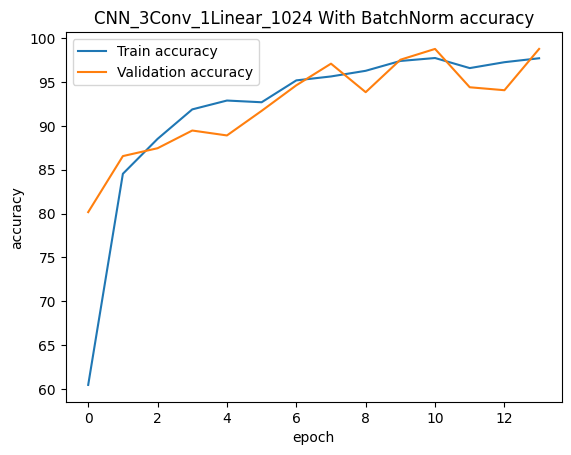

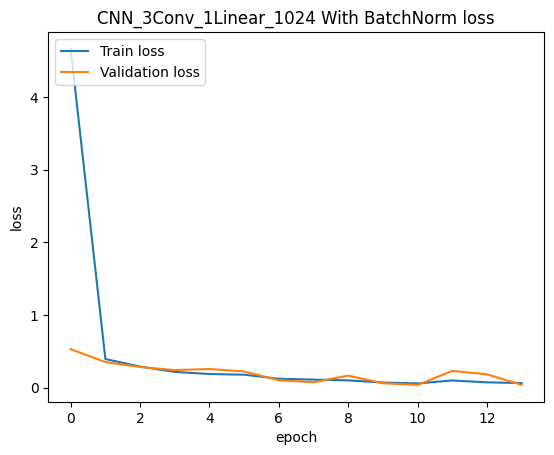

CNN_3Conv_1Linear_1024 With BatchNorm: Accuracy 79.7%,	Precision 84.02%,	Recall 79.7%,	F1-score 78.95%
Detail report: 
                      precision    recall  f1-score   support

Speed limit (40km/h)       0.69      0.92      0.79        76
Speed limit (60km/h)       0.62      0.36      0.46        44
speed limit (80km/h)       0.83      0.23      0.36        44
        Dont Go Left       0.97      0.83      0.89        92
              No Car       0.68      0.92      0.78        50
  watch out for cars       0.93      0.65      0.76        40
   Bicycles crossing       0.37      0.92      0.52        24
      Zebra Crossing       1.00      1.00      1.00        40
         No stopping       1.00      0.93      0.96        86
            No entry       0.96      1.00      0.98        46

            accuracy                           0.80       542
           macro avg       0.80      0.78      0.75       542
        weighted avg       0.84      0.80      0.79       542



<Figure size 1000x1000 with 0 Axes>

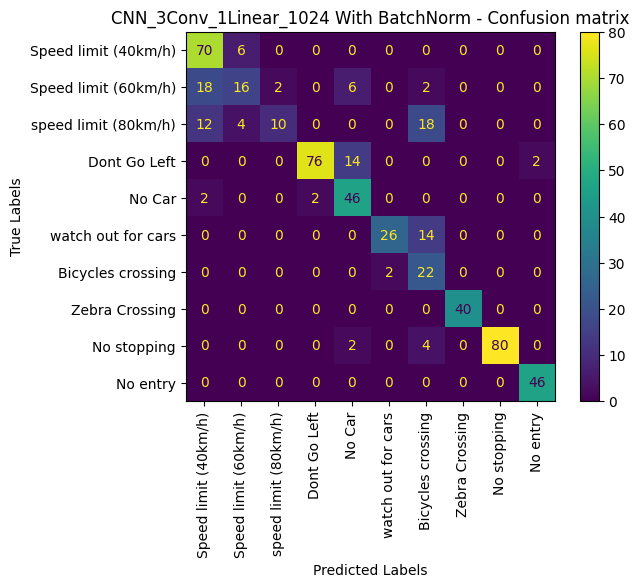

In [151]:
try_model(model_name='CNN_3Conv_1Linear_1024 With BatchNorm', 
          notes='BatchNorm, weigh decay',
          conv_channels=[64, 128, 256], 
          use_batch_normalization=True, # Use batch Norm
          conv_dropouts=[0.3, 0.3, 0.3],
          fc_units=1024,
          lr=LEARNING_RATE,
          weight_decay=0.0001, # Use Weigh decay
          epochs=EPOCHS,
          batch_size=BATCH_SIZE,#Not change, tested, not re processing dataloader
          device=device)

Epoch [1/40], Train Loss: 1.6645, Train Accuracy: 57.15% Val Loss: 1.1851, Val Accuracy: 56.28%
Epoch [2/40], Train Loss: 0.4416, Train Accuracy: 82.29% Val Loss: 0.6130, Val Accuracy: 78.48%
Epoch [3/40], Train Loss: 0.2784, Train Accuracy: 89.10% Val Loss: 0.4440, Val Accuracy: 82.74%
Epoch [4/40], Train Loss: 0.1931, Train Accuracy: 92.32% Val Loss: 0.2019, Val Accuracy: 92.15%
Epoch [5/40], Train Loss: 0.1567, Train Accuracy: 93.95% Val Loss: 0.1338, Val Accuracy: 95.52%
Epoch [6/40], Train Loss: 0.1057, Train Accuracy: 95.94% Val Loss: 0.1050, Val Accuracy: 96.64%
Epoch [7/40], Train Loss: 0.0734, Train Accuracy: 97.23% Val Loss: 0.0360, Val Accuracy: 99.44%
Epoch [8/40], Train Loss: 0.0637, Train Accuracy: 97.42% Val Loss: 0.0713, Val Accuracy: 97.31%
Epoch [9/40], Train Loss: 0.0577, Train Accuracy: 98.09% Val Loss: 0.0338, Val Accuracy: 99.22%
Epoch [10/40], Train Loss: 0.0516, Train Accuracy: 97.93% Val Loss: 0.0368, Val Accuracy: 98.88%
Epoch [11/40], Train Loss: 0.0313, Trai

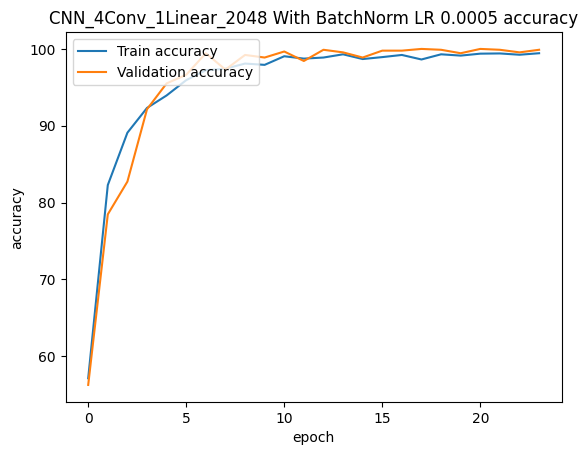

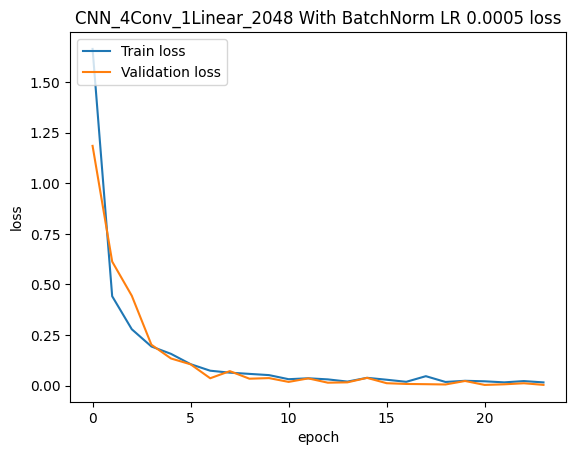

CNN_4Conv_1Linear_2048 With BatchNorm LR 0.0005: Accuracy 90.77%,	Precision 93.58%,	Recall 90.77%,	F1-score 90.7%
Detail report: 
                      precision    recall  f1-score   support

Speed limit (40km/h)       0.97      1.00      0.99        76
Speed limit (60km/h)       0.90      0.82      0.86        44
speed limit (80km/h)       0.80      0.91      0.85        44
        Dont Go Left       1.00      0.89      0.94        92
              No Car       0.86      0.96      0.91        50
  watch out for cars       1.00      0.40      0.57        40
   Bicycles crossing       0.48      1.00      0.65        24
      Zebra Crossing       1.00      1.00      1.00        40
         No stopping       1.00      0.98      0.99        86
            No entry       1.00      1.00      1.00        46

            accuracy                           0.91       542
           macro avg       0.90      0.90      0.88       542
        weighted avg       0.94      0.91      0.91       542


<Figure size 1000x1000 with 0 Axes>

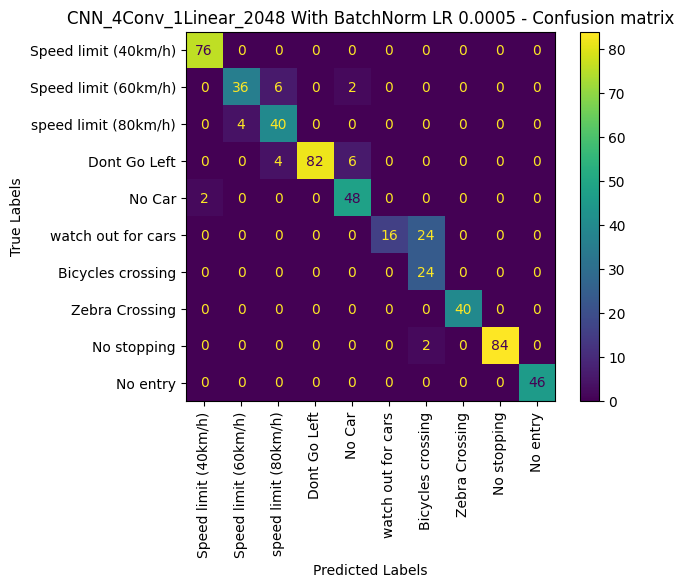

In [152]:
try_model(model_name='CNN_4Conv_1Linear_2048 With BatchNorm LR 0.0005', 
          notes='BatchNorm, weigh decay',
          conv_channels=[32, 64, 128, 256], 
          use_batch_normalization=True, # Use batch Norm
          conv_dropouts=[0.3, 0.3, 0.3, 0.3],
          fc_units=2048,
          lr=0.0005, #Change learning rate
          weight_decay=0.00005, # Use Weigh decay
          epochs=EPOCHS*2, # with Early Stopping
          batch_size=BATCH_SIZE,) #Not change, tested, not re processing dataloader

Epoch [1/20], Train Loss: 2.4204, Train Accuracy: 52.89% Val Loss: 1.1225, Val Accuracy: 58.07%
Epoch [2/20], Train Loss: 0.5501, Train Accuracy: 78.45% Val Loss: 0.6487, Val Accuracy: 73.99%
Epoch [3/20], Train Loss: 0.3533, Train Accuracy: 85.93% Val Loss: 0.4054, Val Accuracy: 84.75%
Epoch [4/20], Train Loss: 0.2559, Train Accuracy: 89.57% Val Loss: 0.2736, Val Accuracy: 88.90%
Epoch [5/20], Train Loss: 0.2161, Train Accuracy: 91.82% Val Loss: 0.2604, Val Accuracy: 89.80%
Epoch [6/20], Train Loss: 0.1877, Train Accuracy: 93.13% Val Loss: 0.1748, Val Accuracy: 93.50%
Epoch [7/20], Train Loss: 0.1116, Train Accuracy: 95.54% Val Loss: 0.0556, Val Accuracy: 98.09%
Epoch [8/20], Train Loss: 0.1187, Train Accuracy: 96.02% Val Loss: 0.0870, Val Accuracy: 97.31%
Epoch [9/20], Train Loss: 0.0910, Train Accuracy: 96.72% Val Loss: 0.0775, Val Accuracy: 96.64%
Epoch [10/20], Train Loss: 0.0955, Train Accuracy: 96.55% Val Loss: 0.0442, Val Accuracy: 99.10%
Epoch [11/20], Train Loss: 0.0557, Trai

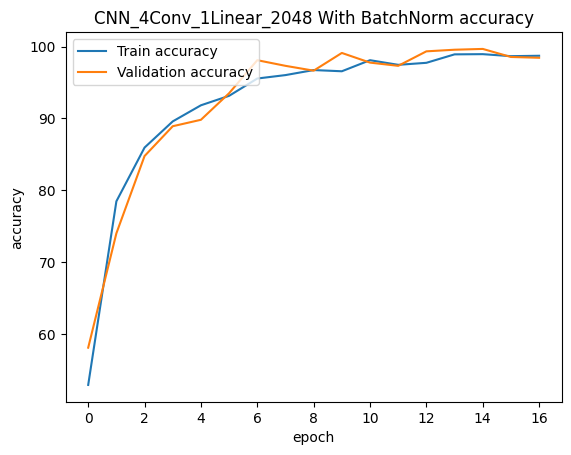

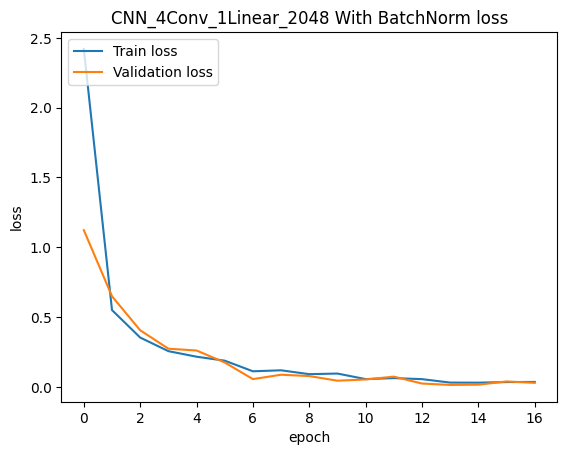

CNN_4Conv_1Linear_2048 With BatchNorm: Accuracy 77.12%,	Precision 86.5%,	Recall 77.12%,	F1-score 76.6%
Detail report: 
                      precision    recall  f1-score   support

Speed limit (40km/h)       0.89      0.84      0.86        76
Speed limit (60km/h)       0.48      0.91      0.62        44
speed limit (80km/h)       1.00      0.23      0.37        44
        Dont Go Left       0.97      0.74      0.84        92
              No Car       0.51      0.96      0.67        50
  watch out for cars       1.00      0.30      0.46        40
   Bicycles crossing       0.48      0.83      0.61        24
      Zebra Crossing       0.95      0.95      0.95        40
         No stopping       1.00      0.98      0.99        86
            No entry       1.00      0.74      0.85        46

            accuracy                           0.77       542
           macro avg       0.83      0.75      0.72       542
        weighted avg       0.87      0.77      0.77       542



<Figure size 1000x1000 with 0 Axes>

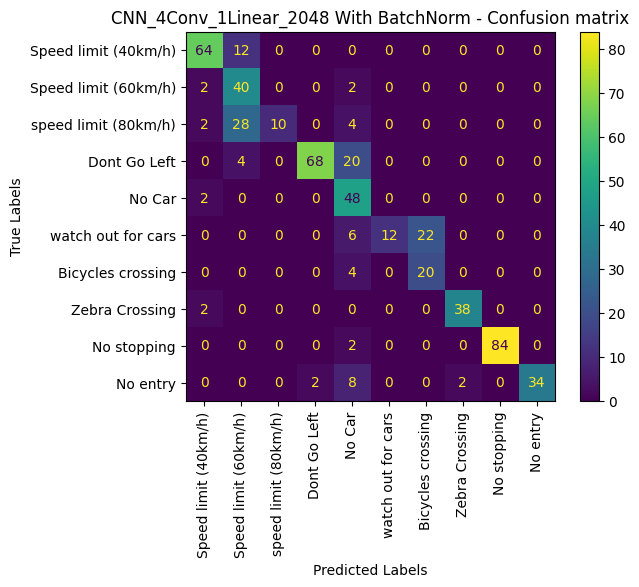

In [153]:
try_model(model_name='CNN_4Conv_1Linear_2048 With BatchNorm', 
          notes='BatchNorm, weigh decay',
          conv_channels=[32, 64, 128, 256], 
          use_batch_normalization=True, # Use batch Norm
          conv_dropouts=[0.4, 0.4, 0.4, 0.4],
          fc_units=2048,
          lr=LEARNING_RATE,
          weight_decay=0.0001, # Use Weigh decay
          epochs=EPOCHS, # with Early Stopping
          batch_size=BATCH_SIZE,) #Not change, tested, not re processing dataloader

In [154]:
results_df = pd.DataFrame([data.to_dict() for data in model_list])
results_df

,model_name,model_type,training_time,accuracy,precision,recall,f1-score,cm,notes
0,CNN_4Conv_1Linear_1024,Pytorch CNN,119.865797,90.77,92.42,90.77,90.49,"[[72, 4, 0, 0, 0, 0, 0, 0, 0, 0], [0, 42, 2, 0...","LR0.001, BS32, EP20/20, Device cuda"
1,CNN_4Conv_1Linear_1024 With BatchNorm,Pytorch CNN,107.884640,87.45,91.55,87.45,86.32,"[[76, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 42, 0, 0...","BatchNorm, weigh decay LR0.001, BS32, EP17/20,..."
2,CNN_3Conv_1Linear_1024 With BatchNorm,Pytorch CNN,116.132676,79.70,84.02,79.70,78.95,"[[70, 6, 0, 0, 0, 0, 0, 0, 0, 0], [18, 16, 2, ...","BatchNorm, weigh decay LR0.001, BS32, EP14/20,..."
3,CNN_4Conv_1Linear_2048 With BatchNorm LR 0.0005,Pytorch CNN,158.659681,90.77,93.58,90.77,90.70,"[[76, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 36, 6, 0...","BatchNorm, weigh decay LR0.0005, BS32, EP24/40..."
4,CNN_4Conv_1Linear_2048 With BatchNorm,Pytorch CNN,111.994162,77.12,86.50,77.12,76.60,"[[64, 12, 0, 0, 0, 0, 0, 0, 0, 0], [2, 40, 0, ...","BatchNorm, weigh decay LR0.001, BS32, EP17/20,..."


In [155]:
import plotly.graph_objects as go

def plot_bar_metric(results_df, title='All model results'):
    # Create a bar plot
    fig = go.Figure()

    for index in range(len(results_df)):
        fig.add_trace(go.Bar(x=['accuracy','precision','recall','f1-score'],
                            y=results_df.iloc[index][['accuracy','precision','recall','f1-score']],
                            name=results_df.iloc[index]['model_name'], 
                            text=results_df.iloc[index][['accuracy','precision','recall','f1-score']], # Text to display 
                            textposition='auto' # Automatically position the text
                            ))
    # Customize layout
    fig.update_layout(
        title=title,
        xaxis_title='Metrics',
        yaxis_title='Values',
        width=1000, 
        height=400,
        barmode='group', # Group bars together 
        yaxis=dict(range=[0, 100]) # Set y-axis range
    )

    # Show the plot
    fig.show()
    
plot_bar_metric(results_df)

In [156]:
def try_data_preprocessing(transform=transform,
                           CONFIG_DARK_IMAGE_BRIGHTNESS_THRESHOLD=CONFIG_DARK_IMAGE_BRIGHTNESS_THRESHOLD,
                           CONFIG_ENHANCED_BRIGHTNESS_DARK_IMAGE=CONFIG_ENHANCED_BRIGHTNESS_DARK_IMAGE):
    """
    For test various data configs
    """
    # Config data dir
    img_dir =  SAVE_DIR + 'data/traffic_Data/'
    csv_file = SAVE_DIR + 'data/labels.csv'
    # Config dir for save processed dark image (if configured)
    if CONFIG_ENHANCED_BRIGHTNESS_DARK_IMAGE:
        img_train_dir = img_dir+"PROCESSED"
    else:
        img_train_dir = img_dir+"DATA"

    # With test dataset, just load
    img_test_dir = img_dir+"TEST"

    # Create an instance of the custom dataset
    train_set = TrafficSignDataset(img_dir=img_train_dir, 
                                csv_file=csv_file, 
                                transform=transform,
                                load_categories=load_categories,
                                brightness_threshold=CONFIG_DARK_IMAGE_BRIGHTNESS_THRESHOLD,
                                CONFIG_OVERSAMPLING=CONFIG_OVERSAMPLING,
                                is_train=True)
    test_set = TrafficSignDataset(img_dir=img_test_dir, 
                                csv_file=csv_file, 
                                transform=transform,
                                load_categories=load_categories,
                                brightness_threshold=CONFIG_DARK_IMAGE_BRIGHTNESS_THRESHOLD,
                                CONFIG_OVERSAMPLING=False, # Never oversampling test
                                is_train=False)

    # Print number of images
    print(f"Loaded {len(train_set)} train images")
    print(f"Loaded {len(test_set)} test images")

    # Define the split sizes
    train_size = int(0.8 * len(train_set))
    val_size = len(train_set) - train_size

    # Split the dataset
    train_set, val_set = random_split(train_set, [train_size, val_size])
    len(train_set), len(val_set), len(test_set)
    ### Convert all to DataLoader
    torch.manual_seed(RANDOM_SEED)
    np.random.seed(RANDOM_SEED)
    
    # Create a DataLoader with the subset dataset
    train_dataloader = DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True)
    val_dataloader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=True)
    test_dataloader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=True)
    return train_dataloader, val_dataloader, test_dataloader


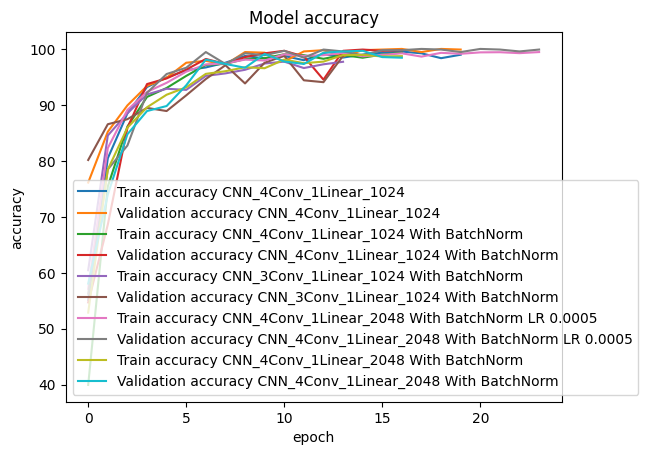

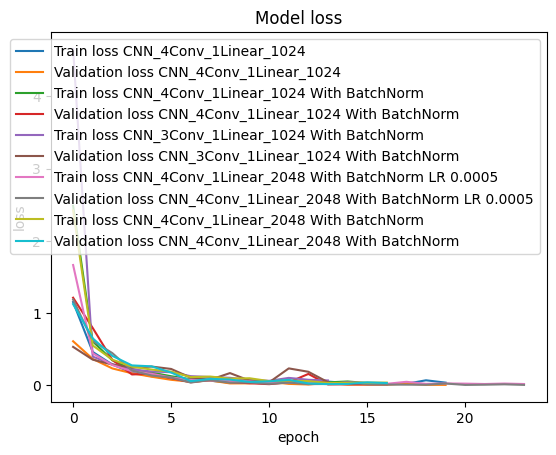

In [157]:
def plot_history_all(model_list,
                     val=False, 
                     metrics=['accuracy', 'loss']):
    """
    Plot all training histories of tensor flow
    Parameters
    ----------
    model_list : List of model data
    val : Print validation metric, default False
    metrics : Metric list to plot, default ['accuracy', 'loss']
    """
    for metric in metrics:
        legend_list=[]
        for i in range(len(model_list)):
            history = model_list[i].history
            name = model_list[i].model_name
            # Plot metric
            plt.plot(history['train_' + metric])
            legend_list.append('Train '+metric+' '+ name)
            # Plot metric for validation set
            if (val): 
                plt.plot(history['val_' + metric])
                legend_list.append('Validation ' + metric+' '+ name)
        plt.legend(legend_list)
        plt.title('Model ' + metric)
        plt.ylabel(metric)
        plt.xlabel('epoch')
        plt.show()

plot_history_all(model_list=model_list,
                 val=True)

Max images 4 displayed


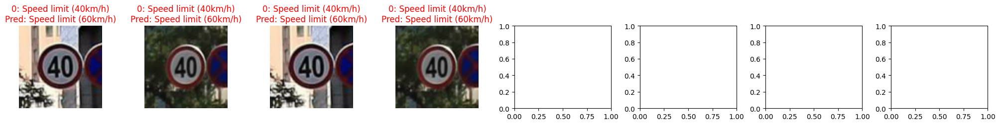

Max images 2 displayed


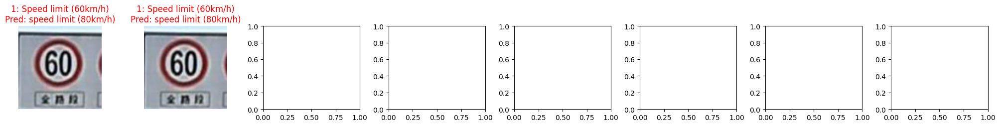

Max images 26 displayed


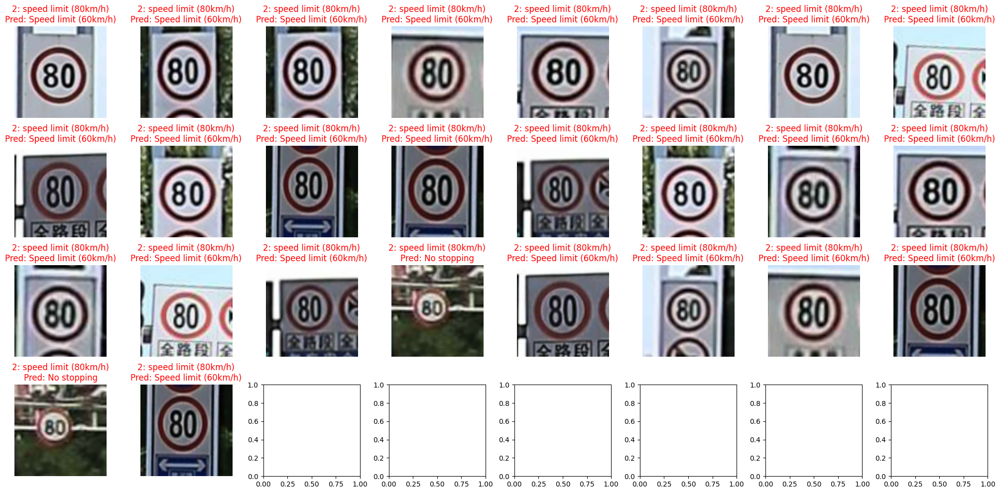

Max images 6 displayed


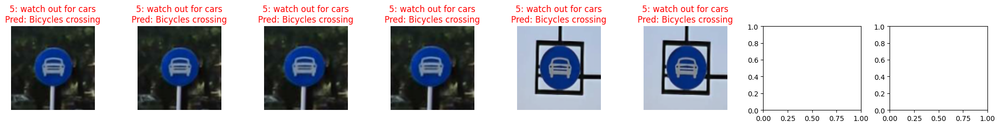

Max images 4 displayed


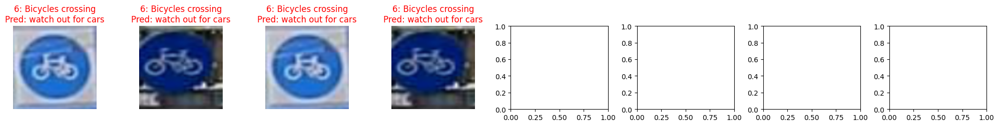

In [ ]:
import math
def show_false_prediction_images(model, test_dataloader, labels_list, img_limit=10, device=device):
    torch.manual_seed(RANDOM_SEED)
    np.random.seed(RANDOM_SEED)
    model.to(device)
    with torch.inference_mode():
        img_list = {label:[] for label in labels_list}
        y_true_list = {label:[] for label in labels_list}
        y_pred_list = {label:[] for label in labels_list}
        for imgs, labels in test_dataloader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            outputs = model(imgs)
            outputs = outputs.cpu()
            _, y_pred = torch.max(outputs, 1)
            y_pred = [i.item() for i in y_pred.cpu()]
            y_true = [i.item() for i in labels.cpu()]
            # Loop all batch
            for img, label, pred in zip(imgs, y_true, y_pred):
                if label == pred or label not in labels_list: continue  # Ignore true prediction
                if (len(img_list[label]) < img_limit):
                    img_list[label].append(img.cpu())
                    y_true_list[label].append(label)
                    y_pred_list[label].append(pred)
        return img_list, y_true_list, y_pred_list

labels_list=[0,1,2,5,6]
# Show prediction results from testset
img_false_list, y_true_list, y_pred_list = show_false_prediction_images(model=model,
                                                                  test_dataloader=test_dataloader,
                                                                  labels_list=labels_list,
                                                                  img_limit=100)
for label in labels_list:
    cols=8
    rows = math.ceil(len(img_false_list[label])/cols)
    display_images(img_false_list[label], rows, cols, y_true=y_true_list[label], start=0, y_pred=y_pred_list[label])

In [ ]:
type(img_false_list[0][0])

torch.Tensor

In [ ]:
def display_false_images(img_false_list, rows, cols, y_true, y_pred, start=0, class_dict=class_dict_new, denormalize=True):
    """
    Display false prediction images from dataset with row x col grid
    """
    fig, axes = plt.subplots(rows, cols, figsize=(cols*2.5, rows*2.5))
    axes = axes.flatten()
    
    for i in range(rows * cols):
        image = img_false_list[i+start]
        label = y_true[i+start]
        # Denormalize if needed
        if denormalize:
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            image = image * std[:, np.newaxis, np.newaxis] + mean[:, np.newaxis, np.newaxis]
            image = np.clip(image, 0, 1)
        if ()
        image = image.permute(1, 2, 0).numpy()
        
        axes[i].imshow(image)
        title = f"{label}"
        color = 'black'
        if (class_dict != None):
            title += f": {class_dict[label]}"
        if y_pred != None:
            pred_label = class_dict[y_pred[i+start]]
            title += f"\nPred: {pred_label}"
            color=("green" if label==y_pred[i] else "red")
        axes[i].set_title(title, color=color)
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

### Save all data

In [ ]:
if CONFIG_SAVE_MODEL:
    for model_data in model_list:
        #torch.save(model_data.model.state_dict(), 
        #           SAVE_DIR+model_data.model_name+".state_dict.pth")
        torch.save(model_data.model, SAVE_DIR+model_data.model_name+".pth") # Save all models
    save_data(data=model_list,
              name='model_list_data',
              directory=SAVE_DIR)
    save_data(data=class_dict_new,
              name='class_dict_new',
              directory=SAVE_DIR)

In [ ]:
import pickle
def load_data(name, directory):
    """
    Load python object from file
    """
    filepath = os.path.join(directory, f'{name}.pkl')
    print (f"Loading {filepath}")
    with open(filepath, 'rb') as file:
        data = pickle.load(file)
        return data
    return None
#model_list = load_data(name='model_list_data',
#                       directory=SAVE_DIR)
#class_dict_new = load_data(name='class_dict_new',
#                           directory=SAVE_DIR)

### Test with real images (can run without above cells excuted)

Output prediction: tensor([[ -0.3896,   3.1943, -11.2064, -10.0980,  -5.5354, -28.5841, -29.5709,
          -3.4294, -12.6590,  25.0511]])
Predicted Class: No entry with id 9, raw output 25.051111221313477


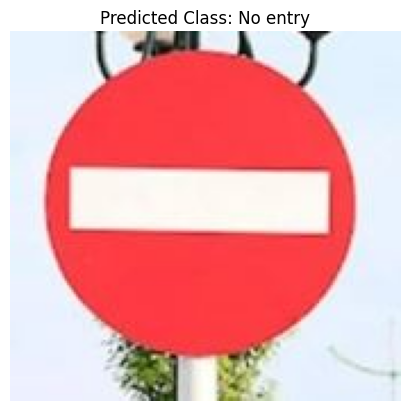

Output prediction: tensor([[ 18.6191,  10.3553,  -8.8034, -15.9494,  -7.3593, -13.3816, -10.4574,
         -10.9611,  -9.2333,  -1.3309]])
Predicted Class: Speed limit (40km/h) with id 0, raw output 18.61908721923828


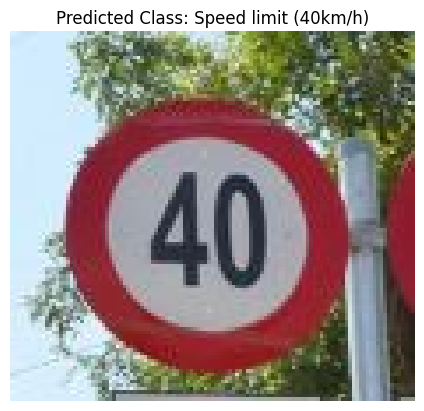

Output prediction: tensor([[ -9.1211,  11.7784,  12.0396,  -5.0715,   2.2019, -15.7135, -15.9492,
         -14.3718, -12.6163,  -9.0463]])
Predicted Class: speed limit (80km/h) with id 2, raw output 12.039621353149414


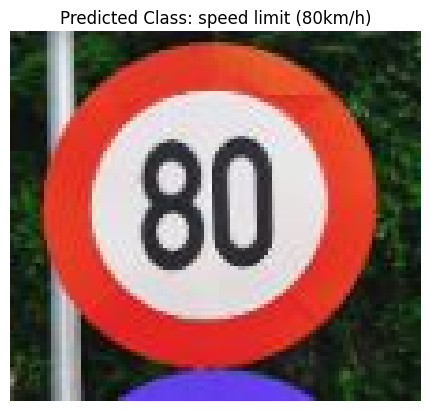

In [ ]:
from PIL import Image
import os, sys
import torch
import matplotlib.pyplot as plt
from torch import nn
from torchvision import transforms

class CNN_Model(nn.Module):
    def __init__(self, num_classes=10, 
                 conv_channels=[32, 64, 128, 256], 
                 use_batch_normalization=False,
                 conv_dropouts=[0.3, 0.3, 0.3, 0.3],
                 fc_units=1024
                 ):
        super(CNN_Model, self).__init__()
        
        self.conv_layers = nn.ModuleList()
        
        in_channels = 3  # Input image has 3 channels (RGB)
        
        for out_channels in conv_channels:
            layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)]
            if use_batch_normalization:
                layers.append(nn.BatchNorm2d(out_channels))
            layers.append(nn.ReLU())
            layers.append(nn.MaxPool2d(kernel_size=2, stride=2, padding=0))
            if conv_dropouts != None:
                layers.append(nn.Dropout(p=0.3))
            self.conv_layers.append(nn.Sequential(*layers))
            in_channels = out_channels

        # Calculate the size after the last conv block to define the input size for the fully connected layer
        self.fc_input_size = conv_channels[-1] * (100 // (2 ** len(conv_channels))) ** 2
        self.block_fc = nn.Sequential(
            nn.Flatten(start_dim=1, end_dim=-1),
            # Fully Connected Layers
            nn.Linear(self.fc_input_size, fc_units),
            nn.ReLU(),
            nn.Linear(fc_units, num_classes)
        )
        
    def forward(self, x):
        for conv_layer in self.conv_layers:
            x = conv_layer(x)
        x = self.block_fc(x)
        return x

def test_real_image(imgs_path, model_path, class_name, IMG_SIZE, device):
    # Load model (not just state dict)
    model = torch.load(model_path, weights_only=False)
    model.eval().to(device)

    # Transform for real images
    transform_test_data = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    for img_path in imgs_path:
        # Load the image using PIL 
        pil_image = Image.open(img_path).convert('RGB') 
        # Apply the transformations 
        input_tensor = transform_test_data(pil_image).unsqueeze(0).to(device) # Add batch dimension

        with torch.no_grad(): 
            output = model(input_tensor).cpu()
            _, predicted = torch.max(output, 1)
            prob = list(output[0])[predicted.item()].item()
            # Print the predicted class 
            print (f"Output prediction: {output}")
            print(f"Predicted Class: {class_name[predicted.item()]} with id {predicted.item()}, raw output {prob}")

            # Display the image and the predicted label using matplotlib 
            plt.imshow(pil_image)
            plt.title(f"Predicted Class: {class_name[predicted.item()]}") 
            plt.axis('off') # Turn off axis labels
            plt.show()

class_dict_new={0: 'Speed limit (40km/h)',
                1: 'Speed limit (60km/h)',
                2: 'speed limit (80km/h)',
                3: 'Dont Go Left',
                4: 'No Car',
                5: 'watch out for cars',
                6: 'Bicycles crossing',
                7: 'Zebra Crossing',
                8: 'No stopping',
                9: 'No entry'}

# Check save dir
SAVE_DIR = "DeepLearningPytorch_INFO6147/Project/"
if not os.path.isdir(SAVE_DIR):
    SAVE_DIR=''# Current dir -> Change this

test_real_image(imgs_path=[SAVE_DIR+"test.jpg",
                           SAVE_DIR+"test2.jpg",
                           SAVE_DIR+"test3.jpg"],
                model_path=SAVE_DIR+"CNN_4Conv_1Linear_1024.pth",
                class_name=class_dict_new,
                device='cpu',
                IMG_SIZE=100)